In [214]:
import polars as pl
import numpy as np
import warnings
import matplotlib.pyplot as plt
from eval_utils import plot_array, calculate_statistics

warnings.filterwarnings("ignore")
commission = 0.25 / 10000.0

## Read market data, calc return value

In [215]:
input_df = pl.read_parquet("data/kline_1d_df.parquet")
input_df = input_df.rename({"jj_code": "symbol"})

input_df = input_df.sort(['symbol', 'open_time'])

input_df = input_df.sort(["symbol", "open_time"])
input_column_name = input_df.columns


# 千万注意，这里是计算此时刻相对于前一时刻的return，不能使用未来信息 -> shift(1)是整体往下移动
input_df = input_df.with_columns(
    ((pl.col("close") / pl.col("close").shift(1) - 1) * 100)
    .over("symbol")  # Applying the function over each symbol group
    .alias("return")
).fill_null (0)


input_df = input_df.with_columns(
    pl.col("return").abs().rolling_sum(window_size=10).over("symbol").alias("rolling_abs_return_sum"),
    pl.col("quote_volume").rolling_sum(window_size=10).over("symbol").alias("rolling_quote_volume_sum")
)

input_df = input_df.with_columns(
    (pl.col("rolling_abs_return_sum") / pl.col("rolling_quote_volume_sum"))
    .over("symbol")  # Apply the final operation within each symbol group
    .alias("amihud")
).fill_null(0)

input_df = input_df.drop(["rolling_abs_return_sum", "rolling_volume_sum"])

input_df

symbol,open_time,close_time,open,high,low,close,volume,quote_volume,count,taker_buy_volume,taker_buy_quote_volume,return,rolling_quote_volume_sum,amihud
str,datetime[ms],datetime[ms],f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64
"""1000BONKUSDT""",2023-11-22 00:00:00,2023-11-22 23:59:59.999,0.00478,0.004825,0.004076,0.004531,1.2701e10,5.6368e7,320715,6.1849e9,2.7467e7,0.0,0.0,0.0
"""1000BONKUSDT""",2023-11-23 00:00:00,2023-11-23 23:59:59.999,0.004531,0.004858,0.00393,0.004267,1.8971e10,8.1590e7,573386,8.8982e9,3.8318e7,-5.826528,0.0,0.0
"""1000BONKUSDT""",2023-11-24 00:00:00,2023-11-24 23:59:59.999,0.004267,0.004335,0.003835,0.00414,1.7169e10,6.9929e7,475254,7.9410e9,3.2393e7,-2.97633,0.0,0.0
"""1000BONKUSDT""",2023-11-25 00:00:00,2023-11-25 23:59:59.999,0.004143,0.0046,0.004084,0.00434,1.3093e10,5.6988e7,501832,6.3891e9,2.7819e7,4.830918,0.0,0.0
"""1000BONKUSDT""",2023-11-26 00:00:00,2023-11-26 23:59:59.999,0.004341,0.004473,0.0039,0.004039,8.2273e9,3.4347e7,344203,3.8247e9,1.5980e7,-6.935484,0.0,0.0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""ZRXUSDT""",2024-07-31 00:00:00,2024-07-31 23:59:59.999,0.3687,0.3906,0.3646,0.3652,6.5032e7,2.4503e7,122713,3.2302293e7,1.2168e7,-0.949281,1.4854e8,2.0855e-7
"""ZRXUSDT""",2024-08-01 00:00:00,2024-08-01 23:59:59.999,0.3652,0.3681,0.3287,0.3493,5.6218e7,1.9616e7,130262,2.7723e7,9.6720e6,-4.353779,1.6106e8,1.8871e-7
"""ZRXUSDT""",2024-08-02 00:00:00,2024-08-02 23:59:59.999,0.3492,0.3521,0.3139,0.3162,4.5774e7,1.5214e7,98768,2.2284e7,7.4088e6,-9.476095,1.5871e8,2.5055e-7


##  Read data with single factor ready

In [216]:
import os
result_hour_path = 'data/result_hour.parquet'
result_hour_path = 'data/result_hour_alpha101.parquet'
result_hour = pl.read_parquet(result_hour_path)
result_hour

symbol,open_time,close_time,open,high,low,close,volume,quote_volume,count,taker_buy_volume,taker_buy_quote_volume,return,rolling_quote_volume_sum,amihud,return_auto_corr_1_pearson_lag1,return_auto_corr_1_spearman_lag1,return_auto_corr_1_kendall_lag1,return_auto_corr_1_pearson_lag2,return_auto_corr_1_spearman_lag2,return_auto_corr_1_kendall_lag2,return_auto_corr_1_pearson_lag5,return_auto_corr_1_spearman_lag5,return_auto_corr_1_kendall_lag5,return_auto_corr_1_pearson_lag10,return_auto_corr_1_spearman_lag10,return_auto_corr_1_kendall_lag10,return_skew,return_kurtosis,alpha13,alpha15,alpha16,alpha30,alpha33,alpha34,alpha35,alpha36,alpha38,alpha40,alpha44,alpha45,alpha46,alpha47,alpha49,alpha50,alpha51,alpha54,alpha55
str,datetime[ms],datetime[ms],f64,f64,f64,f64,f64,f64,i64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""EGLDUSDT""",2020-09-14 00:00:00,2020-09-14 23:59:59.999,13.294,15.213,12.7,13.978,372653.0,5.1572e6,43803,171486.7,2.3757e6,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.135669,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.395723,-0.0
"""EGLDUSDT""",2020-09-15 00:00:00,2020-09-15 23:59:59.999,13.997,15.039,12.837,13.066,590234.6,8.2892e6,66822,257414.3,3.6225e6,-6.524539,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.902645,0.99818,0.0,0.0,0.0,0.0,-0.0,0.0,0.912,0.0,0.912,0.0,0.912,-0.146717,-0.0
"""EGLDUSDT""",2020-09-16 00:00:00,2020-09-16 23:59:59.999,13.04,13.047,11.83,12.584,295253.6,3.6770e6,45251,132037.9,1.6470e6,-3.688964,0.0,0.0,-1.0,-1.0,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,-1.129887,0.0,0.0,0.780243,0.996723,0.0,0.0,0.0,0.0,-0.0,0.0,0.482,0.0,0.482,0.0,0.482,-0.740244,-0.0
"""EGLDUSDT""",2020-09-17 00:00:00,2020-09-17 23:59:59.999,12.578,12.88,11.74,12.044,233613.2,2.8414e6,42226,106637.1,1.2973e6,-4.291163,0.0,0.0,-0.970067,-1.0,-1.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,0.388318,-1.5,0.0,-1.729539,0.0,0.0,0.81841,0.996957,0.0,0.0,0.0,0.0,-0.0,0.0,0.54,0.0,0.54,0.0,0.54,-0.331263,-0.0
"""EGLDUSDT""",2020-09-18 00:00:00,2020-09-18 23:59:59.999,12.061,12.308,10.874,11.233,224249.0,2.6301e6,42709,96451.9,1.1298e6,-6.733643,0.0,0.0,-0.654636,-0.4,-0.333333,0.26019,0.5,0.333333,NaN,NaN,NaN,NaN,NaN,NaN,0.773632,1.608859,-0.733641,-1.9848,-0.690754,0.0,0.90795,0.894761,0.0,0.0,0.0,0.0,-0.858589,0.0,0.811,0.0,0.811,0.0,0.811,-0.357259,-0.0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""STGUSDT""",2024-07-31 00:00:00,2024-07-31 23:59:59.999,0.3639,0.3694,0.3554,0.3564,1.1206154e7,4.0756e6,35930,5.399445e6,1.9649e6,-2.061006,5.8544e7,4.1317e-7,0.05408,-0.017386,-0.013116,-0.0501,-0.041732,-0.0288,-0.009167,0.0107,0.006917,0.061643,-0.020268,-0.014525,1.694803,13.817672,-0.454787,-1.193548,-0.187917,0.090229,0.684622,0.921022,-0.0,1.726493,-0.072252,-0.202602,0.140313,0.0,1.0,-0.184161,0.0075,-0.650302,0.0075,-0.079267,0.14622
"""STGUSDT""",2024-08-01 00:00:00,2024-08-01 23:59:59.999,0.3563,0.359,0.3307,0.3494,2.0514936e7,7.0811e6,59204,1.0074711e7,3.4767e6,-1.964085,5.5838e7,3.7096e-7,0.054274,-0.016678,-0.012614,-0.049856,-0.041005,-0.028224,-0.009237,0.010316,0.006598,0.062163,-0.018891,-0.013566,1.697026,13.8379,-0.083968,-0.882868,-0.043169,0.143576,0.674575,0.933283,132.0,1.358929,-0.028003,-0.094675,0.875392,0.100439,1.0,-0.098676,0.007,-0.896927,0.007,-0.728651,0.10209
"""STGUSDT""",2024-08-02 00:00:00,2024-08-02 23:59:59.999,0.3494,0.356,0.3265,0.329,2.4521838e7,8.3123e6,58401,1.2567019e7,4.2598e6,-5.83858,5.1041e7,4.4209e-7,0.054804,-0.015264,-0.011567,-0.049192,-0.039478,-0.027183,-0.008601,0.011822,0.007674,0.063307,-0.016344,-0.011847,1.69923,13.858619,-0.039932,-0.634557,-0.033708,0.17802,0.880307,0.484137,-0.0,1.534017,-0.0103,0.194822,0.914447,0.127522,1.0,0.036942,0.0204,-0.904074,0.0204,-0.114486,0.487671


## Function for evaluation one single factor

In [217]:
def PlotFactorDistribution (result_hour, FACTOR_NAME):
    # 选择因子列
    factor_data = result_hour.select(FACTOR_NAME).fill_nan(0)

    # 计算描述性统计信息
    descriptive_stats = factor_data.describe().to_pandas()  # 使用to_pandas()仅用于美观的输出
    print(descriptive_stats)

    # 计算均值和标准差
    stats = result_hour.fill_nan(0).select([
        pl.col(FACTOR_NAME).mean().alias('mean'),
        pl.col(FACTOR_NAME).std().alias('std')
    ])

    print (stats.to_numpy())

    mean = stats.to_numpy()[0][0]
    std = stats.to_numpy()[0][1]

    # 计算3个标准差的范围
    lower_bound = mean - 3 * std
    upper_bound = mean + 3 * std

    # 统计超出3个标准差的值的数量
    outliers = result_hour.filter((pl.col(FACTOR_NAME) < lower_bound) | (pl.col(FACTOR_NAME) > upper_bound))
    outlier_count = outliers.height

    print(f'Values beyond 3 standard deviations: {outlier_count}')
    print(f'Percentage of total: {(outlier_count / result_hour.height * 100):.2f}%')

    # 可视化这些极端值
    plt.figure(figsize=(10, 6))
    result_hour.select(FACTOR_NAME).to_pandas().hist(bins=60, color='blue', alpha=0.7)
    plt.axvline(lower_bound, color='red', linestyle='dashed', linewidth=2)
    plt.axvline(upper_bound, color='red', linestyle='dashed', linewidth=2)
    plt.title(f'Distribution of {FACTOR_NAME} with 3SD Limits')
    plt.xlabel(FACTOR_NAME)
    plt.ylabel('Frequency')
    plt.show()



In [218]:
def factor_stats(n, pnl:pl.Series):
    net_value = pnl.cum_sum() + 1.0
    sharpe = n ** 0.5 * pnl.mean() / pnl.std()
    ann_return = n * pnl.mean()
    maxdd = (-(net_value / net_value.cum_max() - 1)).max()
    calmar_ratio = ann_return / maxdd

    print("ann_return =", round(ann_return, 4), end='  ')
    print("sharpe =", round(sharpe, 4), end='  ')
    print("maxdd =", round(maxdd, 4), end='  ')
    print("calmar_ratio =", round(calmar_ratio, 4), end='  ')



In [219]:
def PlotLongShortReturn (factors, ret, columns, n):
    AGG_TO_WEEK = 0
    factors_np = factors[columns].to_numpy()
    ret_np = ret[columns].to_numpy()


    # 求每一行的分位数
    percentage = 0.5
    quantiles = np.nanquantile(factors_np, [1 - percentage, percentage], axis=1)

    # 把quantiles[0]和[1]变成factors_np的shape
    f = lambda x: quantiles[x][:, None].repeat(factors_np.shape[1], axis=-1)
    long_quantile, short_quantile = f(0), f(1)

    # print (f'quantiles: {quantiles} .  long_quantile: {long_quantile}, short_quantile: {short_quantile}')

    # return before fee
    long = np.nan_to_num(np.nan_to_num(ret_np * (factors_np > long_quantile), 0.0).sum(axis=1) / (factors_np > long_quantile).sum(axis=1) , 0.0)
    short = np.nan_to_num(np.nan_to_num(ret_np * (factors_np < long_quantile), 0.0).sum(axis=1) / (factors_np < long_quantile).sum(axis=1) , 0.0)
    bench = np.nan_to_num(np.nanmean(ret_np, axis=1), 0.0)

    # return after fee
    long_fee = pl.Series(long - 2 * commission)
    short_fee = pl.Series(short - 2 * commission)
    bench_fee = pl.Series(bench - 2 * commission)

    long_short = pl.Series(long - short - 2 * commission)
    long_bench = pl.Series(long - bench - 2 * commission)
    bench_short = pl.Series(bench - short - 2 * commission)
    bench_long = pl.Series(bench - long - 2 * commission)
    short_long = pl.Series(short - long - 2 * commission)
    short_bench = pl.Series(short - bench - 2 * commission)

    long_cum = long_fee.cum_sum()
    short_cum = short_fee.cum_sum()
    bench_cum = bench_fee.cum_sum()

    long_short_cum = long_short.cum_sum()
    long_bench_cum = long_bench.cum_sum()
    bench_short_cum = bench_short.cum_sum()
    bench_long_cum = bench_long.cum_sum()
    short_long_cum = short_long.cum_sum()
    short_bench_cum = short_bench.cum_sum()

    plt.figure(figsize=(10, 6))
    plt.plot(factors["open_time"].to_pandas(), long_cum.to_pandas(), label='long', linewidth=1)
    plt.plot(factors["open_time"].to_pandas(), short_cum.to_pandas(), label='short', linewidth=1)
    plt.plot(factors["open_time"].to_pandas(), bench_cum.to_pandas(), label='bench', linewidth=2, color="gray")
    plt.title("accumulate long & short & bench")
    plt.legend()
    plt.show()

    # print (long_cum.shape, short_cum.shape, bench_cum.shape)
    # print (long_cum, short_cum, bench_cum)
    # print (f'factor dim: {factors.shape}, ret dim: {ret.shape}')
    # print (factors)
    # print (factors["open_time"].to_pandas())

    # 因子评价指标
    print("long: ")
    factor_stats(n, long_fee)
    print("\n")
    print("short: ")
    factor_stats(n, short_fee)
    print("\n")
    print("bench: ")
    factor_stats(n, bench_fee)
    print("\n")


    plt.figure(figsize=(10, 6))
    plt.plot(factors["open_time"].to_pandas(), long_short_cum.to_pandas(), label='long_short', linewidth=1)
    plt.plot(factors["open_time"].to_pandas(), long_bench_cum.to_pandas(), label='long_bench', linewidth=1)
    # plt.plot(factors["open_time"].to_pandas(), bench_short_cum.to_pandas(), label='bench_short', linewidth=1)
    # plt.plot(factors["open_time"].to_pandas(), bench_long_cum.to_pandas(), label='bench_long', linewidth=1)
    # plt.plot(factors["open_time"].to_pandas(), short_long_cum.to_pandas(), label='short_long', linewidth=1)
    plt.plot(factors["open_time"].to_pandas(),short_bench_cum.to_pandas(), label='short_bench', linewidth=1)
    plt.title("accumulate returns of six strategies")
    plt.legend()
    plt.show()


    # 因子评价指标
    print("long_short: ")
    factor_stats(n, long_short)
    print("\n")

    print("long_bench: ")
    factor_stats(n, long_bench)
    print("\n")

    print("bench_short: ")
    factor_stats(n, bench_short)
    print("\n")

    print("bench_long: ")
    factor_stats(n, bench_long)
    print("\n")

    print("short_long: ")
    factor_stats(n, short_long)
    print("\n")

    print("short_bench: ")
    factor_stats(n, short_bench)
    print("\n")

    ###################################################################################################################


In [220]:
# GROUP_NUM = 20
def PlotGroupReturn (factors, ret, columns, n, GROUP_NUM = 20):
    factors_np = factors[columns].to_numpy()
    ret_np = ret[columns].to_numpy()
    quantiles = np.nanquantile(factors_np, np.linspace(0, 1, GROUP_NUM + 1), axis=1)
    total_count = np.count_nonzero(~np.isnan(factors_np), axis=1)
    f = lambda x: quantiles[x][:, None].repeat(factors_np.shape[1], axis=-1)

    #bench_return = np.nan_to_num(ret_np, 0.0).mean(axis=1)
    bench_return = np.nan_to_num(np.nanmean(ret_np, axis=1), 0.0)
    bench_return_fee = np.nan_to_num(np.nanmean(ret_np, axis=1), 0.0) - 2 * commission
    group_return = np.zeros((factors_np.shape[0], GROUP_NUM))
    group_diff_return = np.zeros((factors_np.shape[0], GROUP_NUM))


    for i in range(1, GROUP_NUM + 1):
        # 计算在当前分位数范围内的总收益。如果因子值位于该分位数的范围内，则相应的收益被计入总和。
        ret_sum = np.nan_to_num(ret_np * (f(i-1) <= factors_np) * (factors_np <= f(i)), 0.0).sum(axis=1)
        # 计算当前分位数范围内的有效数据点数
        ret_count = np.nan_to_num((f(i-1) <= factors_np) * (factors_np <= f(i)), 0.0).sum(axis=1)
        group_return[:, i-1] = ret_sum / ret_count - 2 * commission 
        group_diff_return[:, i-1] = ret_sum / ret_count - bench_return - 2 * commission


    group_return = np.nan_to_num(group_return)
    group_diff_return = np.nan_to_num(group_diff_return)


    plt.figure(figsize=(10, 6))
    plt.title(f"{GROUP_NUM} group accumulate return")
    for i in range(GROUP_NUM):
        plt.plot(factors["open_time"].to_pandas(), np.cumsum(group_return[:, i]), label=f"group_{i+1}", linewidth=1)
    plt.plot(factors["open_time"].to_pandas(), np.cumsum(bench_return_fee), label=f"bench_return", linewidth=2, color="gray")
    plt.legend()
    plt.show()

    for i in range(GROUP_NUM):
        print(f"group_{i+1}: ")
        net_value = np.cumsum(group_return[:, i]) + 1.0
        sharpe = n ** 0.5 * group_return[:, i].mean() / group_return[:, i].std()
        ann_return = n * group_return[:, i].mean()
        maxdd = (-(net_value / np.maximum.accumulate(net_value) - 1)).max()
        calmar_ratio = ann_return / maxdd
        print("ann_return =", round(ann_return, 4), end='  ')
        print("sharpe =", round(sharpe, 4), end='  ')
        print("maxdd =", round(maxdd, 4), end='  ')
        print("calmar_ratio =", round(calmar_ratio, 4), end='  ')
        print("\n")


    plt.figure(figsize=(10, 6))
    plt.title(f"{GROUP_NUM} group-bench accumulate return")
    for i in range(GROUP_NUM):
        plt.plot(factors["open_time"].to_pandas(), np.cumsum(group_diff_return[:, i]), label=f"group_diff_{i+1}", linewidth=1)
    plt.legend()
    plt.show()

    for i in range(GROUP_NUM):
        print(f"group_diff_{i+1}: ")
        net_value = np.cumsum(group_diff_return[:, i]) + 1.0
        sharpe = n ** 0.5 * group_diff_return[:, i].mean() / group_diff_return[:, i].std()
        ann_return = n * group_diff_return[:, i].mean()
        maxdd = (-(net_value / np.maximum.accumulate(net_value) - 1)).max()
        calmar_ratio = ann_return / maxdd
        print("ann_return =", round(ann_return, 4), end='  ')
        print("sharpe =", round(sharpe, 4), end='  ')
        print("maxdd =", round(maxdd, 4), end='  ')
        print("calmar_ratio =", round(calmar_ratio, 4), end='  ')
        print("\n")

    ###################################################################################################################
    def GetGroupCombinationReturn (input_factors_np: np.ndarray, input_ret_np: np.ndarray, group_index_list: list)-> np.ndarray:
        total_ret_sum = np.zeros(input_factors_np.shape[0])
        total_ret_count = np.zeros(input_factors_np.shape[0])
        
        # Loop through each group index in the list
        for i in group_index_list:
            assert i >= 1 and i <= GROUP_NUM, f"Group index {i} is out of range"
            # Compute the mask for the current group
            group_mask = (f(i-1) <= input_factors_np) & (input_factors_np <= f(i))
            
            # Calculate the return sum for the current group
            ret_sum = np.nan_to_num(input_ret_np * group_mask, nan=0.0).sum(axis=1)
            total_ret_sum += ret_sum
            
            # Calculate the count of returns for the current group
            ret_count = np.nan_to_num(group_mask, nan=0.0).sum(axis=1)
            total_ret_count += ret_count
        
        # Compute the average return per count, adjust for commission
        return  total_ret_sum / total_ret_count - 2 * commission
        

    if GROUP_NUM >= 20:
        GROUP_COMBINATION_LIST = [[20], [19], [18], [20, 19], [20, 19, 18], [1], [2], [3], [1, 2], [1, 2, 3]]  # start from 1 
    elif GROUP_NUM >= 10:
        GROUP_COMBINATION_LIST = [[1], [10], [1, 2], [9, 10]]  # start from 1
    else:
        GROUP_COMBINATION_LIST = []
    group_combination_result = [[] for _ in range(len(GROUP_COMBINATION_LIST))]

    tmp = []

    for long_group_index_list in GROUP_COMBINATION_LIST:
        short_group_index_list = [(GROUP_NUM + 1 - i) for i in long_group_index_list]
        long_return = GetGroupCombinationReturn(factors_np, ret_np, long_group_index_list)
        short_return = GetGroupCombinationReturn(factors_np, ret_np, short_group_index_list)
        cur_return = long_return - short_return - 2 * commission
        tmp.append (cur_return)
        print (f'long_group_index_list: {long_group_index_list}, short_group_index_list: {short_group_index_list}', end = ' === ')
        factor_stats (n, pl.Series(np.nan_to_num(cur_return, 0.0)))
        print (' ')
        

    plt.figure(figsize=(10, 6))  # Optional: Specifies the figure size

    for idx, returns in enumerate(tmp):
        cumulative_returns = np.cumsum(np.nan_to_num (returns, 0))  # Calculate cumulative returns
        # plt.plot(cumulative_returns, label=f'Group Combination {idx + 1}')  # Plot cumulative returns
        idx_str = ','.join([str(i) for i in GROUP_COMBINATION_LIST[idx]])
        plt.plot(cumulative_returns, label = '[' + idx_str + ']')  # Plot cumulative returns


    # Adding labels and title for clarity
    plt.title('Group Combination Returns Over Time')
    plt.xlabel('Time (Index)')
    plt.ylabel('Net Returns')
    plt.legend()  

In [221]:
import numpy as np
from scipy.stats import kendalltau, rankdata, spearmanr
from scipy import stats

def AnalyseICAndRankIC (factors_np: np.ndarray, ret_np: np.ndarray, FACTOR_NAME: str):
    USE_PEARSOM = 0
    USE_SPEARMAN = 0

    num_timestamps = factors_np.shape[0]
    num_stocks = factors_np.shape[1]

    # Initialize an array to store the IC values
    ic_values = np.zeros(num_timestamps)
    rank_ic_values = np.zeros(num_timestamps)

    for i in range(num_timestamps):
        # Extract the factor values and return values for the current timestamp
        factor_values = factors_np[i, :]
        returns = ret_np[i, :]

        # Find indices where both factor_values and returns are not NaN
        valid_indices = ~(np.isnan(factor_values) | np.isnan(returns))

        # Filter out NaN values
        factor_values_valid = factor_values[valid_indices]
        returns_valid = returns[valid_indices]

        # Rank the valid arrays
        ranked_factors = rankdata(factor_values_valid)
        ranked_returns = rankdata(returns_valid)

        # Calculate the Pearson correlation coefficient (IC)
        if len(factor_values_valid) > 1:
            if USE_PEARSOM:
                ic_values[i] = np.corrcoef(factor_values_valid, returns_valid)[0, 1]
                rank_ic_values[i] = np.corrcoef(ranked_factors, ranked_returns)[0, 1]
            elif USE_SPEARMAN:
                ic_values[i] = spearmanr(factor_values_valid, returns_valid).correlation
                rank_ic_values[i] = spearmanr(ranked_factors, ranked_returns).correlation
            else:
                tau, _ = kendalltau(factor_values_valid, returns_valid)
                rank_tau, _ = kendalltau(ranked_factors, ranked_returns)
                # print (f'tau: {tau} == factor_values: {factor_values_valid} == returns: {returns_valid}')
                ic_values[i] = tau
                rank_ic_values[i] = rank_tau
        else:
            ic_values[i] = np.nan

    # print_statistics(ic_values, "IC")
    ic_stat: dict = calculate_statistics (ic_values)
    print ('ic stat dict', ic_stat)
    plot_array(f"{FACTOR_NAME} IC result", ic_values, cumulative = False)
    plot_array(f"{FACTOR_NAME} IC result", ic_values, cumulative = True)

    # print_statistics(rank_ic_values, "Rank IC")
    rank_ic_stat: dict = calculate_statistics (rank_ic_values)
    print ('rank ic stat dict', rank_ic_stat)
    plot_array(f"{FACTOR_NAME} Rank IC result", rank_ic_values, cumulative = False)
    plot_array(f"{FACTOR_NAME} Rank IC result", rank_ic_values, cumulative = True)



In [222]:
import numpy as np
from scipy.stats import kendalltau
from eval_utils import plot_histogram

def AnalyseGroupIC (factors_np: np.ndarray, ret_np: np.ndarray, FACTOR_NAME: str, GROUP_NUM = 20):
    group_ic_results = []

    # Iterate over each time slice
    for i in range(factors_np.shape[0]):
        factor_values = factors_np[i, :]
        returns = ret_np[i, :]

        # Filter out NaNs
        valid_mask = ~np.isnan(factor_values) & ~np.isnan(returns)
        valid_factors = factor_values[valid_mask]
        valid_returns = returns[valid_mask]

        # Check if there are enough non-NaN data points
        if len(valid_factors) >= GROUP_NUM:
            # Sort indices based on factor values
            sorted_indices = np.argsort(valid_factors)
            sorted_returns = valid_returns[sorted_indices]

            # Divide into groups
            group_edges = np.linspace(0, len(sorted_indices), GROUP_NUM + 1, dtype=int)
            group_returns = []

            for j in range(GROUP_NUM):
                # Indices for j-th group
                start_idx = group_edges[j]
                end_idx = group_edges[j + 1]

                # Calculate average return for the group
                group_average_return = np.nanmean(sorted_returns[start_idx:end_idx])
                group_returns.append(group_average_return)

            # Calculate IC between group indices and group average returns
            group_indices = np.arange(1, GROUP_NUM + 1)
            tau, _ = kendalltau(group_indices, group_returns)
            group_ic_results.append(tau)

    group_ic_results_np = np.array(group_ic_results)

    # print_statistics(group_ic_results_np, "Group IC")
    group_ic_stat = calculate_statistics(group_ic_results_np)
    plot_array(f"{FACTOR_NAME} Group IC:the group number {GROUP_NUM} to each group's average ret", group_ic_results_np, cumulative = False)
    plot_array(f"{FACTOR_NAME} Group IC:the group number {GROUP_NUM} to each group's average ret", group_ic_results_np, cumulative = True)

    plot_histogram(group_ic_results_np, title='Group IC Values Histogram', xlabel='Group IC Value', ylabel='Frequency', bins=30, color='green')

In [223]:
import numpy as np
import statsmodels.api as sm

def CalcRSqaure (factors_np: np.ndarray, ret_np: np.ndarray):
    r_squared_values = []  # Assuming you've initialized this list outside the loop

    for i in range(factors_np.shape[0]):
        # 提取第i行作为X（因子值）和y（回报率）
        X = factors_np[i, :]
        y = ret_np[i, :]

        # 仅保留X和y中均非NaN的数据点
        valid_mask = ~np.isnan(X) & ~np.isnan(y)  # Create a mask to filter valid entries
        X_valid = X[valid_mask]
        y_valid = y[valid_mask]

        if len(X_valid) > 0:  # Ensure there is at least one valid data point to fit the model
            # 为X添加常数项
            X_valid = sm.add_constant(X_valid)

            # 创建并拟合OLS模型
            model = sm.OLS(y_valid, X_valid)
            results = model.fit()

            # 存储每个模型的R-squared值
            r_squared_values.append(results.rsquared)

            # # 验证R-squared值是否正确
            # y_hat = results.predict(X_valid)  # 计算预测值y_hat
            # ss_res = np.sum((y_valid - y_hat) ** 2)
            # ss_tot = np.sum((y_valid - np.mean(y_valid)) ** 2)
            # predicted_r_squared = 1 - (ss_res / ss_tot)
            # print (f'{(results.rsquared - predicted_r_squared):.4f} ==== cacl r_squared: {results.rsquared} == {predicted_r_squared}')
        else:
            # Optionally handle the case where no data is available to fit the model
            r_squared_values.append(np.nan)  # Append NaN or another placeholder to indicate no calculation was possible


    # 移除NaN值以进行有效的统计分析
    valid_r_squared = np.array(r_squared_values)[~np.isnan(r_squared_values)]

    # 计算统计数据
    mean_r_squared = np.mean(valid_r_squared)
    median_r_squared = np.median(valid_r_squared)
    std_r_squared = np.std(valid_r_squared)

    # 打印统计数据
    print(f'Mean R-squared: {mean_r_squared:.4f}')
    print(f'Median R-squared: {median_r_squared:.4f}')
    print(f'Standard Deviation of R-squared: {std_r_squared:.4f}')

    plot_array('R-squared Values', np.array(valid_r_squared), cumulative = False)

In [224]:
def SingleFactorEvalAndPlot (result_hour:pl.DataFrame, FACTOR_NAME, group_num:list):
    close = result_hour[["open_time", "symbol", "close"]].pivot(index="open_time", columns="symbol", values="close").sort("open_time")
    factors = result_hour[["open_time", "symbol", FACTOR_NAME]].pivot(index="open_time", columns="symbol", values = FACTOR_NAME).sort("open_time")

    columns = close.columns[1:]
    print ('factors shape:', factors.shape)
    factors.describe()

    # 因子未来收益率：
    ret = close.clone()
    ret[columns] = ret[columns].shift(-1) / ret[columns] - 1

    # 对齐column
    ret = ret[factors.columns] 
    t = factors[["open_time"]] 

    # 对齐open_time
    ret = ret.join(t, how="inner", on=["open_time"]).sort(by=["open_time"]) 
    factors = factors.sort(by=["open_time"])

    symbol_columns = close.columns[1:]
    factors_np = factors[symbol_columns].to_numpy()
    ret_np = ret[symbol_columns].to_numpy()

    trading_num_per_year = 365 # if AGG_TO_WEEK == 0 else 52
    PlotFactorDistribution (result_hour, FACTOR_NAME)
    PlotLongShortReturn (factors, ret, columns = close.columns[1:], n = trading_num_per_year)
    for each_group_num in group_num:
        PlotGroupReturn (factors, ret, columns = close.columns[1:], n = trading_num_per_year, GROUP_NUM = each_group_num)
    AnalyseICAndRankIC (factors_np, ret_np, FACTOR_NAME)
    for each_group_num in group_num:
        AnalyseGroupIC (factors_np, ret_np, FACTOR_NAME, GROUP_NUM = each_group_num)
    CalcRSqaure (factors_np, ret_np)


    

factor list: ['return_skew', 'amihud', 'return_auto_corr_1_pearson_lag1', 'return_auto_corr_1_pearson_lag10', 'return_auto_corr_1_spearman_lag2']
 ================================================ return_skew ======================================================== 
factors shape: (1678, 305)
    statistic    return_skew
0       count  230723.000000
1  null_count       0.000000
2        mean       0.990605
3         std       2.141031
4         min      -7.601600
5         25%       0.095380
6         50%       0.609350
7         75%       1.322003
8         max      21.581188
[[0.99060547 2.14103142]]
Values beyond 3 standard deviations: 4550
Percentage of total: 1.97%


<Figure size 1000x600 with 0 Axes>

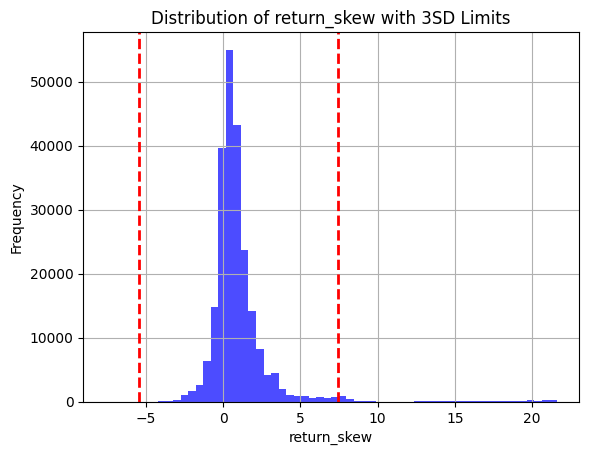

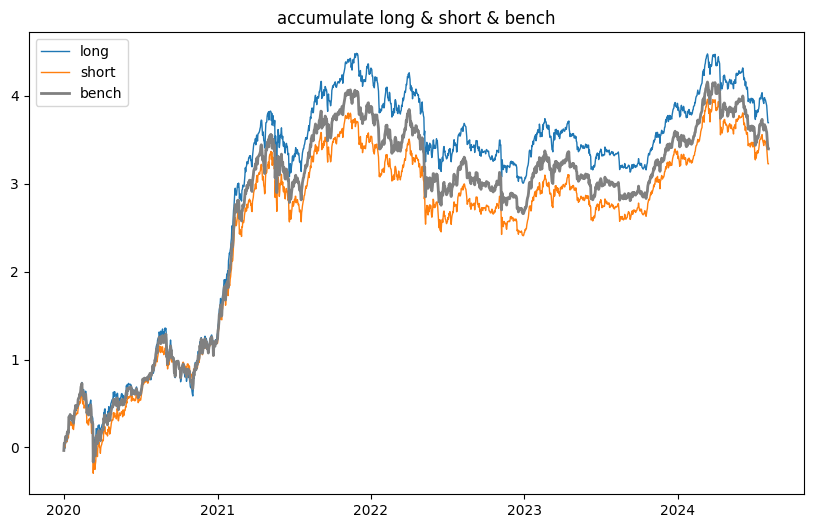

long: 
ann_return = 0.8034  sharpe = 0.8373  maxdd = 0.4853  calmar_ratio = 1.6555  

short: 
ann_return = 0.7018  sharpe = 0.77  maxdd = 0.5674  calmar_ratio = 1.2369  

bench: 
ann_return = 0.7386  sharpe = 0.7942  maxdd = 0.5174  calmar_ratio = 1.4274  



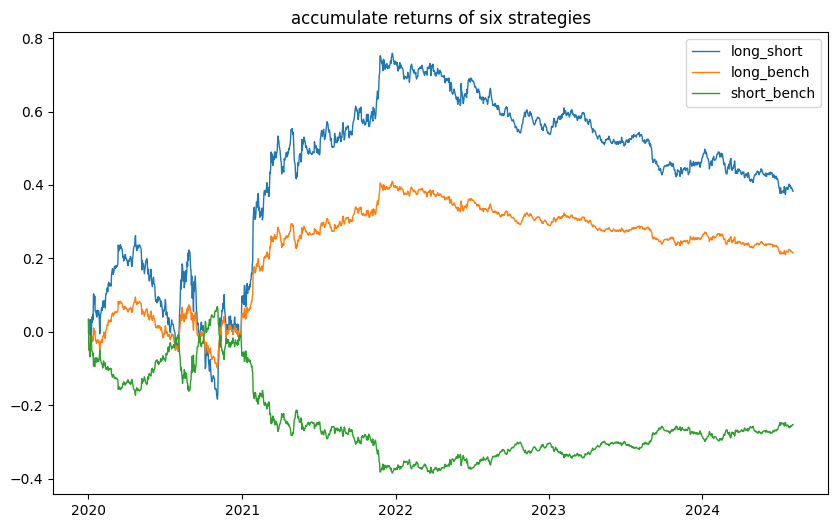

long_short: 
ann_return = 0.0834  sharpe = 0.3431  maxdd = 0.3533  calmar_ratio = 0.2359  

long_bench: 
ann_return = 0.0466  sharpe = 0.3636  maxdd = 0.1776  calmar_ratio = 0.2626  

bench_short: 
ann_return = 0.0185  sharpe = 0.1378  maxdd = 0.2249  calmar_ratio = 0.0822  

bench_long: 
ann_return = -0.0831  sharpe = -0.6483  maxdd = 0.5156  calmar_ratio = -0.1612  

short_long: 
ann_return = -0.1199  sharpe = -0.4934  maxdd = 0.8535  calmar_ratio = -0.1404  

short_bench: 
ann_return = -0.055  sharpe = -0.4099  maxdd = 0.4252  calmar_ratio = -0.1293  



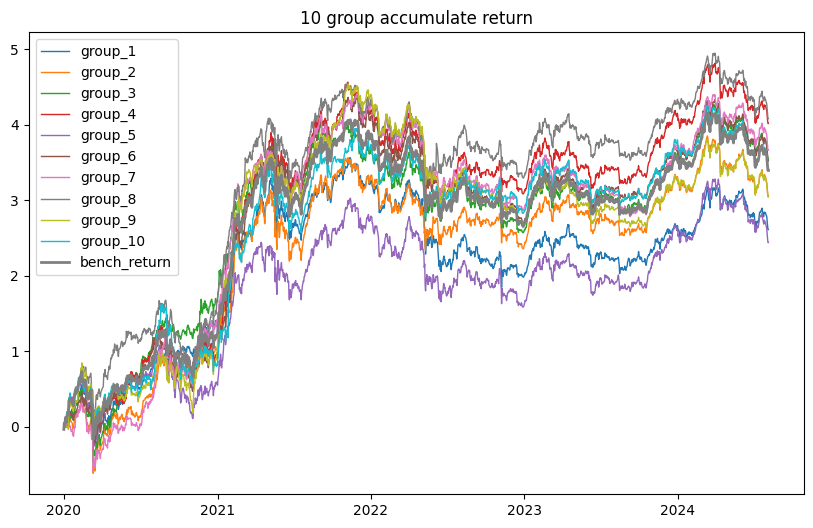

group_1: 
ann_return = 0.5683  sharpe = 0.6417  maxdd = 0.5571  calmar_ratio = 1.0202  

group_2: 
ann_return = 0.6655  sharpe = 0.7055  maxdd = 0.7218  calmar_ratio = 0.9219  

group_3: 
ann_return = 0.7714  sharpe = 0.8111  maxdd = 0.6529  calmar_ratio = 1.1815  

group_4: 
ann_return = 0.8743  sharpe = 0.8937  maxdd = 0.5146  calmar_ratio = 1.699  

group_5: 
ann_return = 0.5311  sharpe = 0.5523  maxdd = 0.5553  calmar_ratio = 0.9564  

group_6: 
ann_return = 0.7658  sharpe = 0.7868  maxdd = 0.5441  calmar_ratio = 1.4074  

group_7: 
ann_return = 0.797  sharpe = 0.8154  maxdd = 0.6915  calmar_ratio = 1.1526  

group_8: 
ann_return = 0.8881  sharpe = 0.8812  maxdd = 0.4088  calmar_ratio = 2.1722  

group_9: 
ann_return = 0.6623  sharpe = 0.6519  maxdd = 0.4758  calmar_ratio = 1.3918  

group_10: 
ann_return = 0.7472  sharpe = 0.7217  maxdd = 0.5261  calmar_ratio = 1.4202  



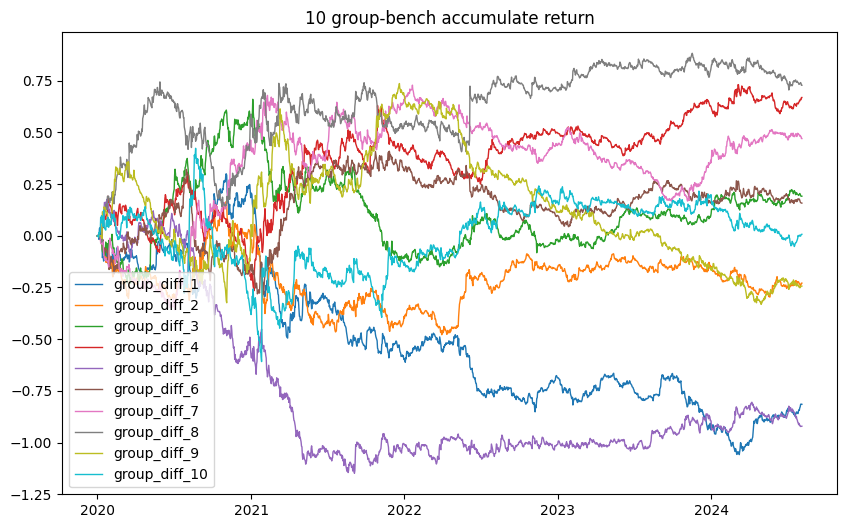

group_diff_1: 
ann_return = -0.1773  sharpe = -0.6293  maxdd = 1.045  calmar_ratio = -0.1697  

group_diff_2: 
ann_return = -0.0498  sharpe = -0.1862  maxdd = 0.5528  calmar_ratio = -0.0901  

group_diff_3: 
ann_return = 0.0417  sharpe = 0.1483  maxdd = 0.488  calmar_ratio = 0.0854  

group_diff_4: 
ann_return = 0.1455  sharpe = 0.4911  maxdd = 0.4293  calmar_ratio = 0.339  

group_diff_5: 
ann_return = -0.2003  sharpe = -0.7651  maxdd = 1.1264  calmar_ratio = -0.1779  

group_diff_6: 
ann_return = 0.0344  sharpe = 0.1264  maxdd = 0.456  calmar_ratio = 0.0754  

group_diff_7: 
ann_return = 0.1023  sharpe = 0.356  maxdd = 0.3577  calmar_ratio = 0.2861  

group_diff_8: 
ann_return = 0.1584  sharpe = 0.4684  maxdd = 0.3463  calmar_ratio = 0.4573  

group_diff_9: 
ann_return = -0.0529  sharpe = -0.165  maxdd = 0.6151  calmar_ratio = -0.0861  

group_diff_10: 
ann_return = 0.0016  sharpe = 0.004  maxdd = 0.7249  calmar_ratio = 0.0022  

long_group_index_list: [1], short_group_index_list: [1

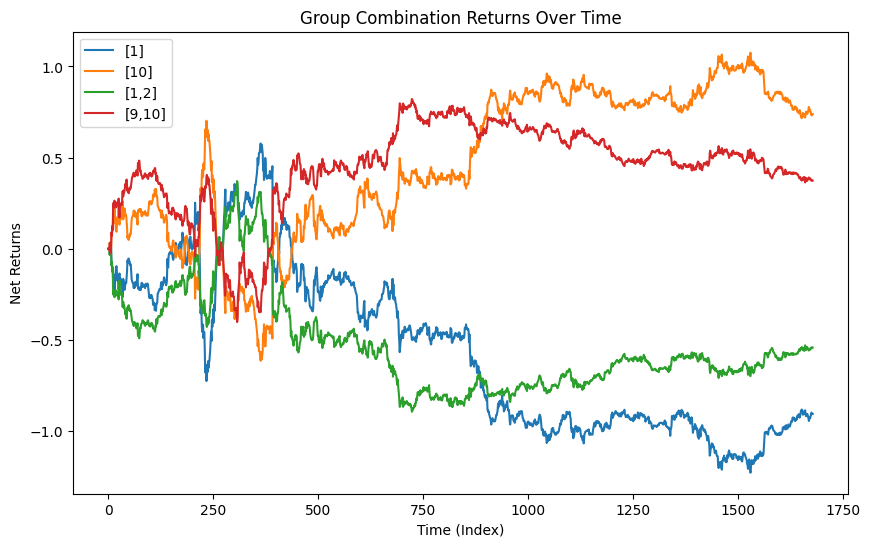

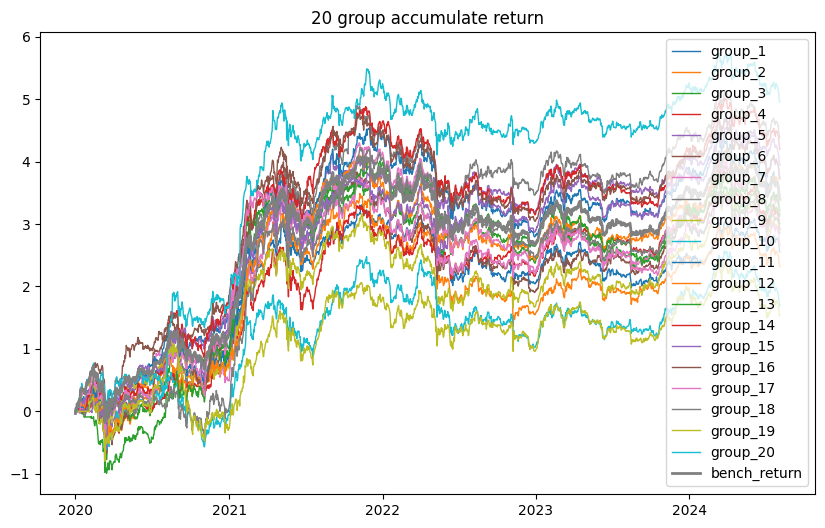

group_1: 
ann_return = 0.555  sharpe = 0.632  maxdd = 0.5744  calmar_ratio = 0.9661  

group_2: 
ann_return = 0.5043  sharpe = 0.5341  maxdd = 0.6642  calmar_ratio = 0.7592  

group_3: 
ann_return = 0.6538  sharpe = 0.6682  maxdd = 0.8953  calmar_ratio = 0.7303  

group_4: 
ann_return = 0.6341  sharpe = 0.6573  maxdd = 0.705  calmar_ratio = 0.8995  

group_5: 
ann_return = 0.8586  sharpe = 0.8689  maxdd = 0.7026  calmar_ratio = 1.222  

group_6: 
ann_return = 0.6999  sharpe = 0.7145  maxdd = 0.7527  calmar_ratio = 0.9298  

group_7: 
ann_return = 0.6874  sharpe = 0.704  maxdd = 0.4921  calmar_ratio = 1.397  

group_8: 
ann_return = 0.9534  sharpe = 0.905  maxdd = 0.7283  calmar_ratio = 1.309  

group_9: 
ann_return = 0.5852  sharpe = 0.5881  maxdd = 0.5819  calmar_ratio = 1.0057  

group_10: 
ann_return = 0.3682  sharpe = 0.3733  maxdd = 0.7484  calmar_ratio = 0.492  

group_11: 
ann_return = 0.7524  sharpe = 0.7442  maxdd = 0.5235  calmar_ratio = 1.4373  

group_12: 
ann_return = 0.75

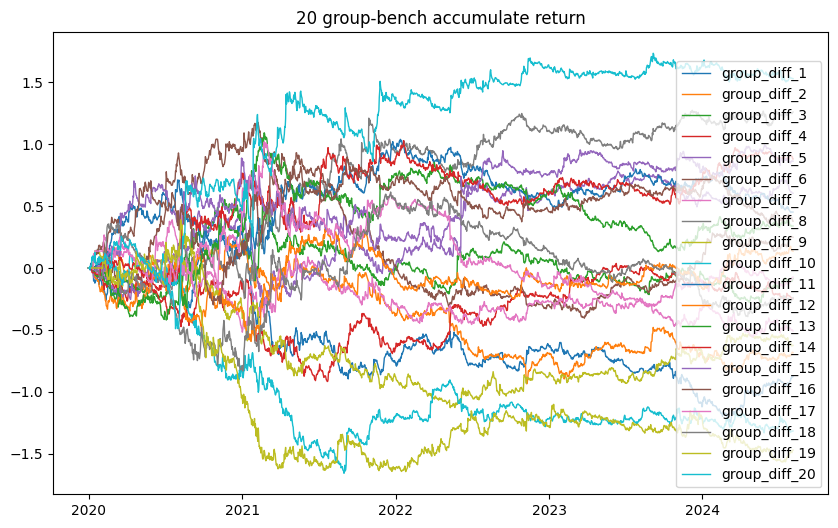

group_diff_1: 
ann_return = -0.1907  sharpe = -0.5301  maxdd = 1.171  calmar_ratio = -0.1628  

group_diff_2: 
ann_return = -0.1486  sharpe = -0.4145  maxdd = 0.9482  calmar_ratio = -0.1567  

group_diff_3: 
ann_return = -0.0186  sharpe = -0.0495  maxdd = 0.525  calmar_ratio = -0.0354  

group_diff_4: 
ann_return = -0.0541  sharpe = -0.1579  maxdd = 0.9158  calmar_ratio = -0.0591  

group_diff_5: 
ann_return = 0.131  sharpe = 0.3504  maxdd = 0.5172  calmar_ratio = 0.2534  

group_diff_6: 
ann_return = 0.0539  sharpe = 0.1399  maxdd = 0.7267  calmar_ratio = 0.0742  

group_diff_7: 
ann_return = -0.016  sharpe = -0.0423  maxdd = 0.653  calmar_ratio = -0.0245  

group_diff_8: 
ann_return = 0.2738  sharpe = 0.6196  maxdd = 0.3901  calmar_ratio = 0.7017  

group_diff_9: 
ann_return = -0.1359  sharpe = -0.3765  maxdd = 1.1112  calmar_ratio = -0.1223  

group_diff_10: 
ann_return = -0.2861  sharpe = -0.7695  maxdd = 1.5697  calmar_ratio = -0.1823  

group_diff_11: 
ann_return = 0.0981  sharpe

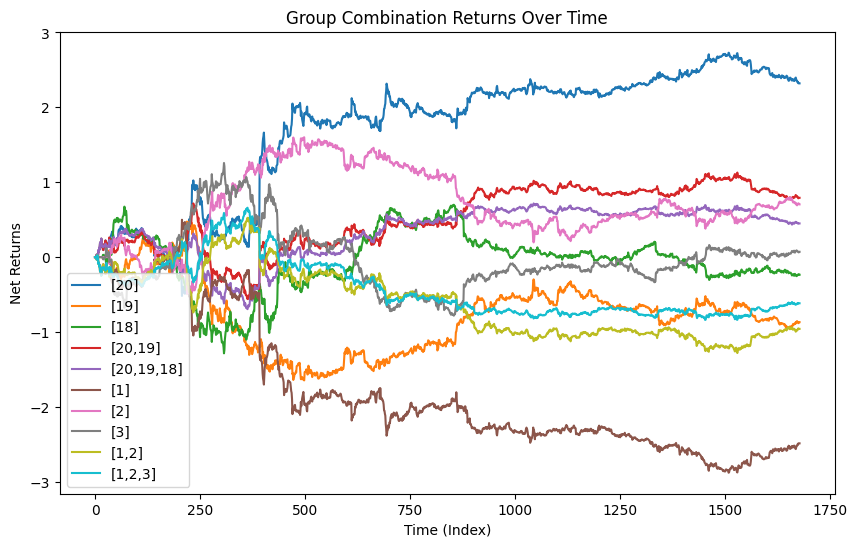

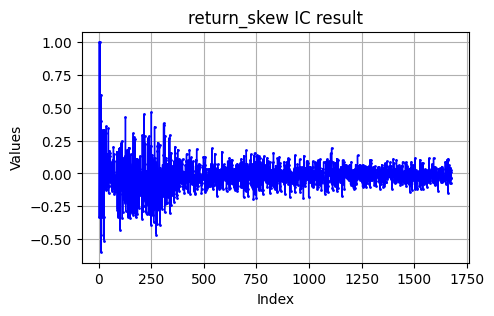

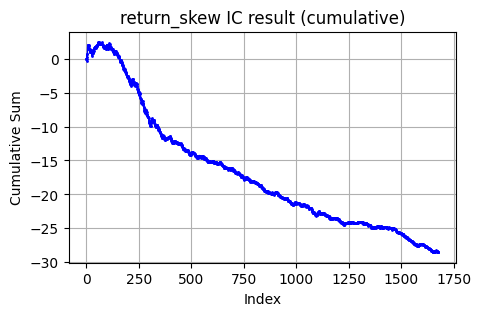

rank ic stat dict {'Mean IC': -0.01697432957824747, 'Median IC': -0.01773744128652177, 'Standard Deviation': 0.1104310473265623, 'Count of Significant ICs (|IC| > 0.1)': 407, 'Proportion of Significant ICs': 0.24255065554231228, 'Information Ratio (IR)': -0.15370975816295265, 'Skewness': 0.8660095661518858, 'Kurtosis': 11.246794512306627, 'T-Value': -6.294597581920465, 'P-Value': 3.9256705218471543e-10}


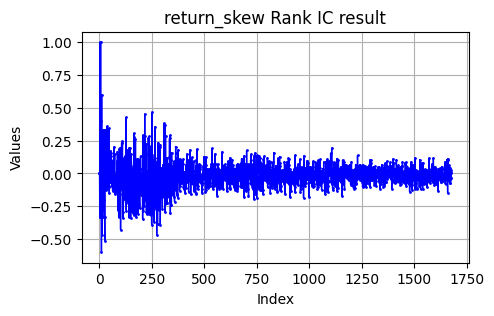

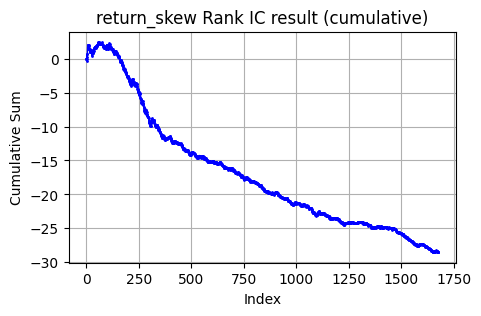

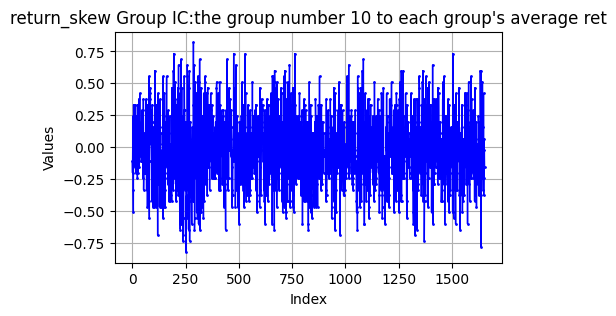

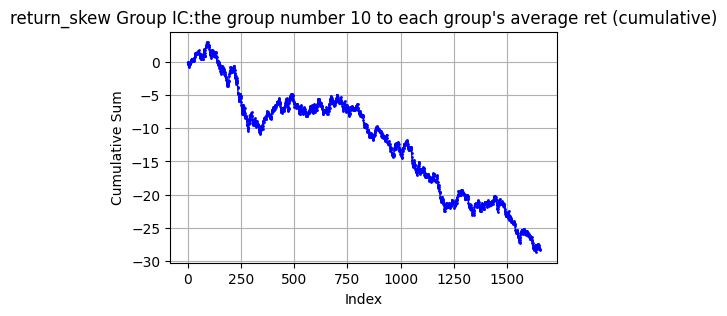

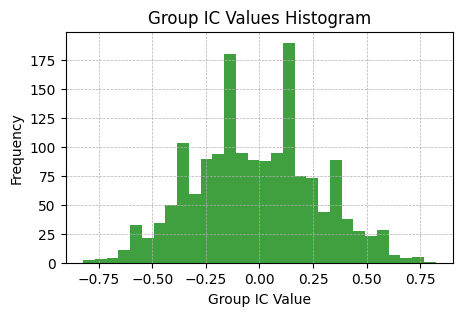

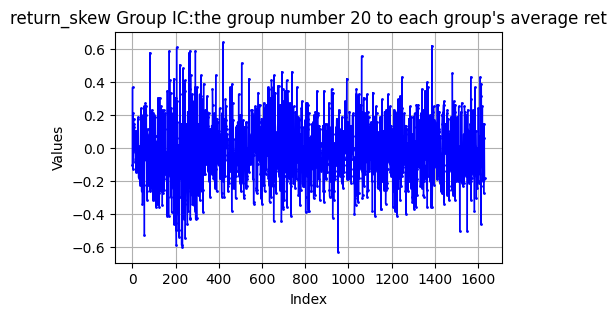

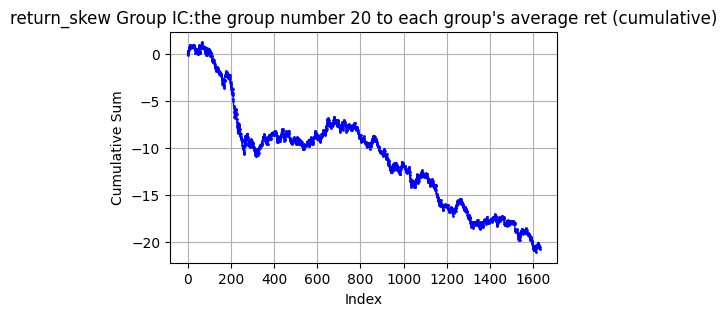

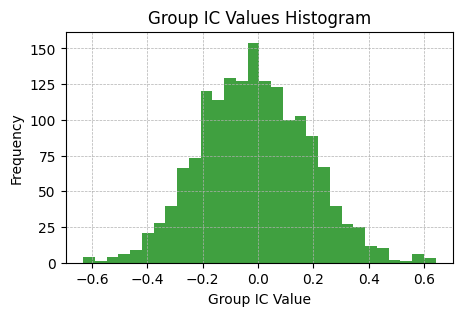

Mean R-squared: 0.0232
Median R-squared: 0.0042
Standard Deviation of R-squared: 0.0621


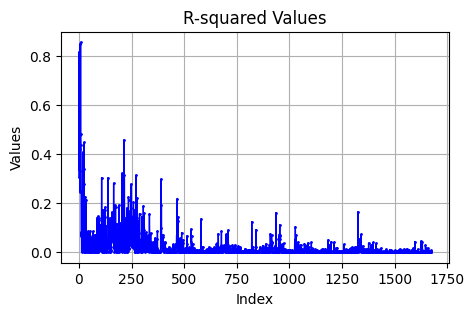

 ================================================ amihud ======================================================== 
factors shape: (1678, 305)
    statistic        amihud
0       count  2.307230e+05
1  null_count  0.000000e+00
2        mean  1.616022e-07
3         std  2.485675e-07
4         min  0.000000e+00
5         25%  3.656207e-08
6         50%  9.940543e-08
7         75%  2.052967e-07
8         max  1.148581e-05
[[1.61602159e-07 2.48567492e-07]]
Values beyond 3 standard deviations: 2761
Percentage of total: 1.20%


<Figure size 1000x600 with 0 Axes>

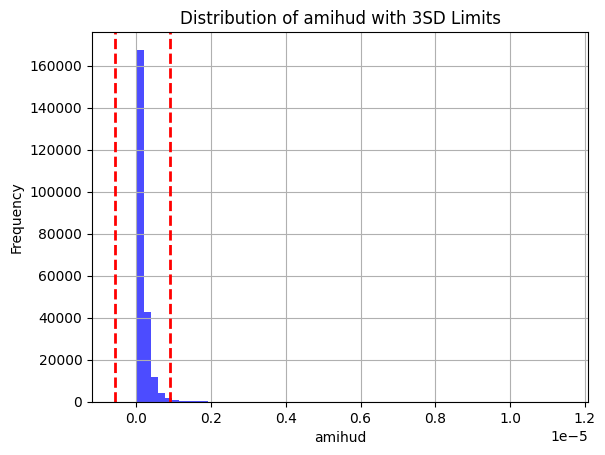

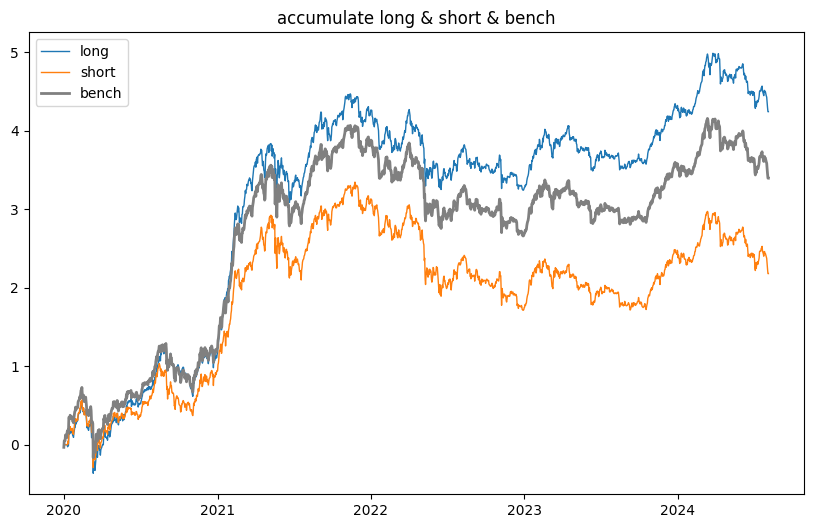

long: 
ann_return = 0.9229  sharpe = 0.9696  maxdd = 0.592  calmar_ratio = 1.5589  

short: 
ann_return = 0.4741  sharpe = 0.5145  maxdd = 0.5492  calmar_ratio = 0.8633  

bench: 
ann_return = 0.7386  sharpe = 0.7942  maxdd = 0.5174  calmar_ratio = 1.4274  



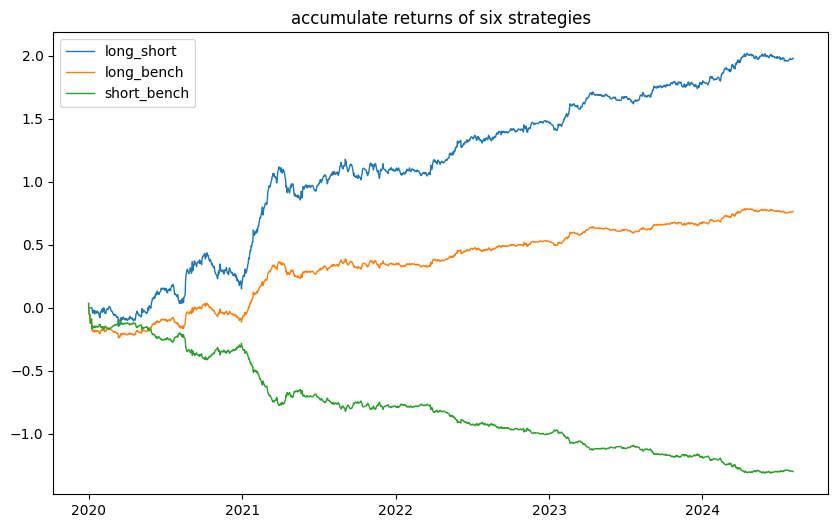

long_short: 
ann_return = 0.4305  sharpe = 1.6293  maxdd = 0.1986  calmar_ratio = 2.1681  

long_bench: 
ann_return = 0.1661  sharpe = 1.1235  maxdd = 0.2642  calmar_ratio = 0.6288  

bench_short: 
ann_return = 0.2462  sharpe = 1.6683  maxdd = 0.1006  calmar_ratio = 2.4465  

bench_long: 
ann_return = -0.2026  sharpe = -1.3703  maxdd = 0.955  calmar_ratio = -0.2122  

short_long: 
ann_return = -0.467  sharpe = -1.7674  maxdd = 2.0308  calmar_ratio = -0.23  

short_bench: 
ann_return = -0.2827  sharpe = -1.9157  maxdd = 1.3029  calmar_ratio = -0.2169  



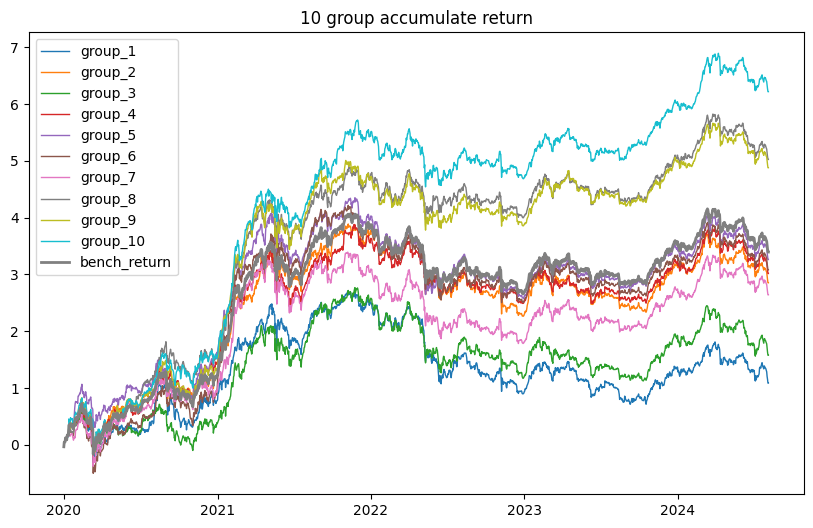

group_1: 
ann_return = 0.2366  sharpe = 0.25  maxdd = 0.5761  calmar_ratio = 0.4106  

group_2: 
ann_return = 0.6209  sharpe = 0.6421  maxdd = 0.5281  calmar_ratio = 1.1757  

group_3: 
ann_return = 0.3433  sharpe = 0.3594  maxdd = 0.486  calmar_ratio = 0.7065  

group_4: 
ann_return = 0.6564  sharpe = 0.6843  maxdd = 0.5094  calmar_ratio = 1.2888  

group_5: 
ann_return = 0.7099  sharpe = 0.7125  maxdd = 0.4232  calmar_ratio = 1.6774  

group_6: 
ann_return = 0.6702  sharpe = 0.6701  maxdd = 0.6748  calmar_ratio = 0.9933  

group_7: 
ann_return = 0.5748  sharpe = 0.5996  maxdd = 0.5931  calmar_ratio = 0.9692  

group_8: 
ann_return = 1.0933  sharpe = 1.1111  maxdd = 0.5124  calmar_ratio = 2.1338  

group_9: 
ann_return = 1.0616  sharpe = 1.0565  maxdd = 0.5465  calmar_ratio = 1.9424  

group_10: 
ann_return = 1.3529  sharpe = 1.3532  maxdd = 0.4623  calmar_ratio = 2.9267  



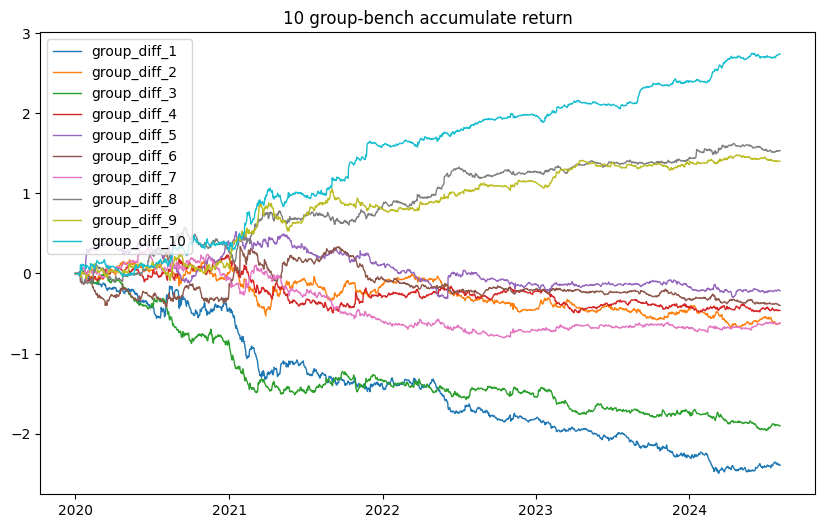

group_diff_1: 
ann_return = -0.5202  sharpe = -1.4767  maxdd = 2.4541  calmar_ratio = -0.212  

group_diff_2: 
ann_return = -0.1359  sharpe = -0.4416  maxdd = 0.7522  calmar_ratio = -0.1807  

group_diff_3: 
ann_return = -0.4135  sharpe = -1.4226  maxdd = 1.9351  calmar_ratio = -0.2137  

group_diff_4: 
ann_return = -0.1004  sharpe = -0.3571  maxdd = 0.5886  calmar_ratio = -0.1705  

group_diff_5: 
ann_return = -0.0469  sharpe = -0.1552  maxdd = 0.5485  calmar_ratio = -0.0854  

group_diff_6: 
ann_return = -0.0866  sharpe = -0.2679  maxdd = 0.5502  calmar_ratio = -0.1573  

group_diff_7: 
ann_return = -0.134  sharpe = -0.4849  maxdd = 0.8498  calmar_ratio = -0.1577  

group_diff_8: 
ann_return = 0.3338  sharpe = 1.1728  maxdd = 0.2836  calmar_ratio = 1.177  

group_diff_9: 
ann_return = 0.3048  sharpe = 1.0185  maxdd = 0.2205  calmar_ratio = 1.3823  

group_diff_10: 
ann_return = 0.5961  sharpe = 1.9682  maxdd = 0.18  calmar_ratio = 3.3112  

long_group_index_list: [1], short_group_ind

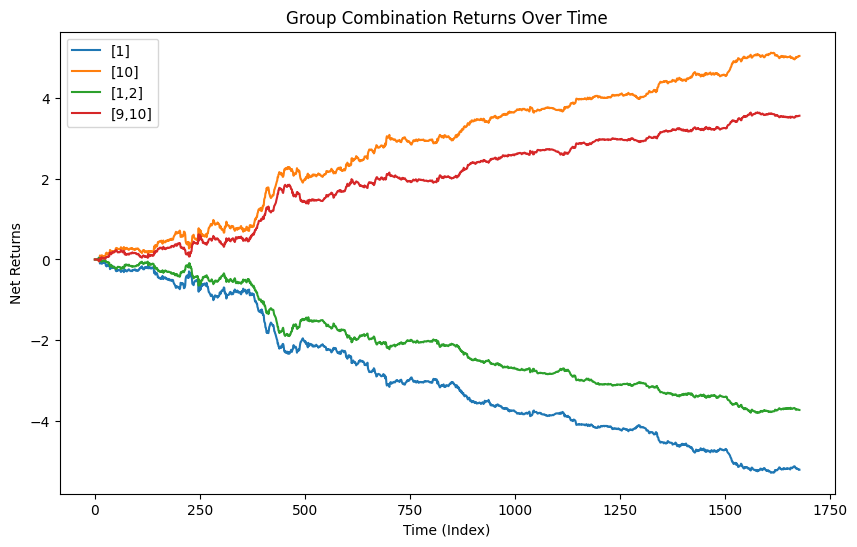

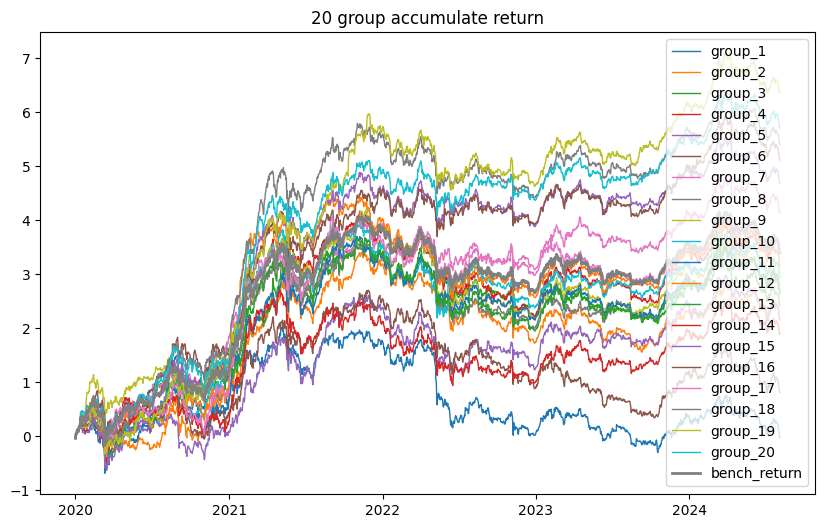

group_1: 
ann_return = -0.0048  sharpe = -0.0049  maxdd = 0.7684  calmar_ratio = -0.0063  

group_2: 
ann_return = 0.4759  sharpe = 0.4788  maxdd = 0.7161  calmar_ratio = 0.6645  

group_3: 
ann_return = 0.5265  sharpe = 0.5234  maxdd = 0.5433  calmar_ratio = 0.9691  

group_4: 
ann_return = 0.6876  sharpe = 0.6884  maxdd = 0.5635  calmar_ratio = 1.2201  

group_5: 
ann_return = 0.4689  sharpe = 0.4739  maxdd = 0.6475  calmar_ratio = 0.7242  

group_6: 
ann_return = 0.1761  sharpe = 0.1765  maxdd = 0.6375  calmar_ratio = 0.2762  

group_7: 
ann_return = 0.7341  sharpe = 0.7358  maxdd = 0.4602  calmar_ratio = 1.5951  

group_8: 
ann_return = 0.5723  sharpe = 0.5688  maxdd = 0.6189  calmar_ratio = 0.9247  

group_9: 
ann_return = 0.6388  sharpe = 0.6256  maxdd = 0.4081  calmar_ratio = 1.5652  

group_10: 
ann_return = 0.6465  sharpe = 0.6111  maxdd = 0.6143  calmar_ratio = 1.0523  

group_11: 
ann_return = 0.5833  sharpe = 0.5778  maxdd = 0.7501  calmar_ratio = 0.7777  

group_12: 
ann_r

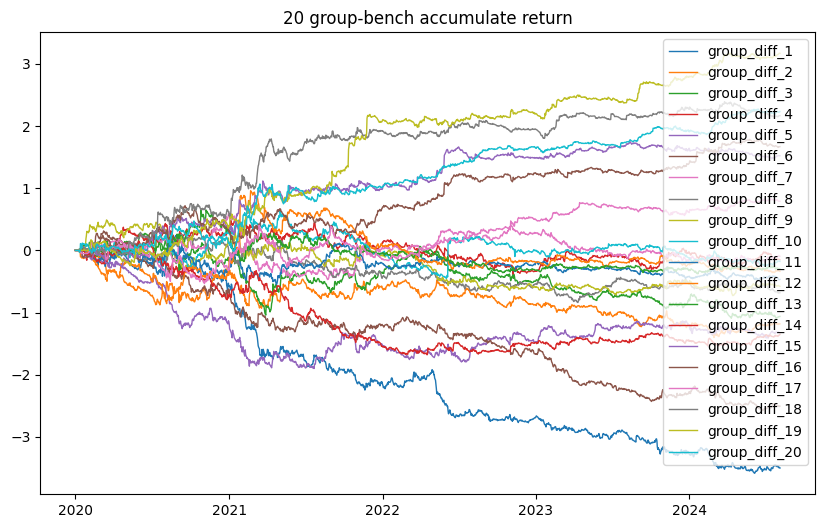

group_diff_1: 
ann_return = -0.7616  sharpe = -1.5275  maxdd = 3.0861  calmar_ratio = -0.2468  

group_diff_2: 
ann_return = -0.2571  sharpe = -0.6127  maxdd = 1.3918  calmar_ratio = -0.1847  

group_diff_3: 
ann_return = -0.231  sharpe = -0.5418  maxdd = 1.0778  calmar_ratio = -0.2143  

group_diff_4: 
ann_return = -0.0329  sharpe = -0.0829  maxdd = 0.5876  calmar_ratio = -0.056  

group_diff_5: 
ann_return = -0.2886  sharpe = -0.7087  maxdd = 1.8768  calmar_ratio = -0.1538  

group_diff_6: 
ann_return = -0.5453  sharpe = -1.4024  maxdd = 2.2013  calmar_ratio = -0.2477  

group_diff_7: 
ann_return = -0.0209  sharpe = -0.0488  maxdd = 0.6699  calmar_ratio = -0.0311  

group_diff_8: 
ann_return = -0.1482  sharpe = -0.3845  maxdd = 0.8722  calmar_ratio = -0.1699  

group_diff_9: 
ann_return = -0.1261  sharpe = -0.3182  maxdd = 0.8175  calmar_ratio = -0.1542  

group_diff_10: 
ann_return = -0.0387  sharpe = -0.0833  maxdd = 0.6643  calmar_ratio = -0.0583  

group_diff_11: 
ann_return = -0

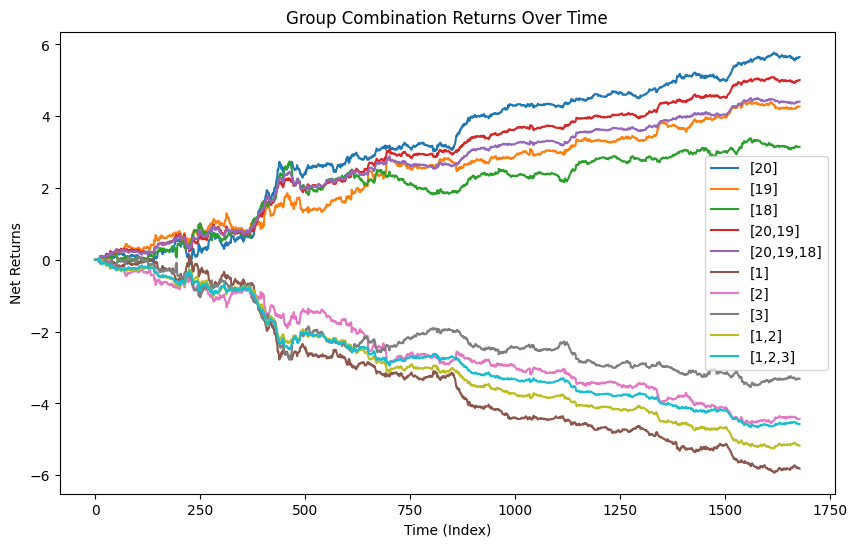

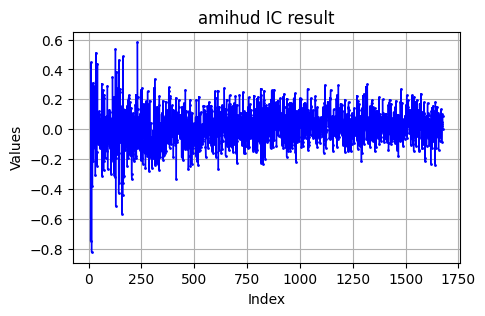

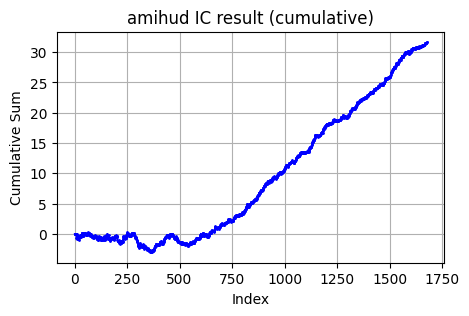

rank ic stat dict {'Mean IC': 0.018955521807099408, 'Median IC': 0.020847016133176115, 'Standard Deviation': 0.12252087352203894, 'Count of Significant ICs (|IC| > 0.1)': 614, 'Proportion of Significant ICs': 0.3678849610545237, 'Information Ratio (IR)': 0.1547125911054634, 'Skewness': -0.3645782865523702, 'Kurtosis': 3.349115997947381, 'T-Value': 6.318641024150099, 'P-Value': 3.3776114957933516e-10}


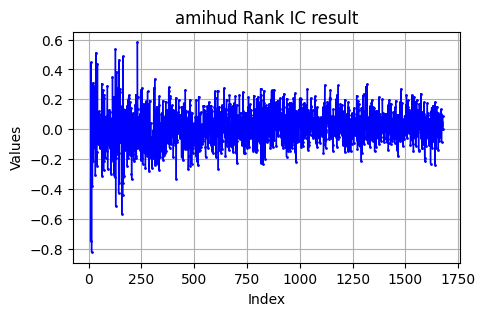

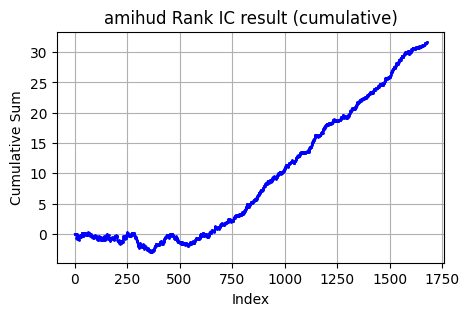

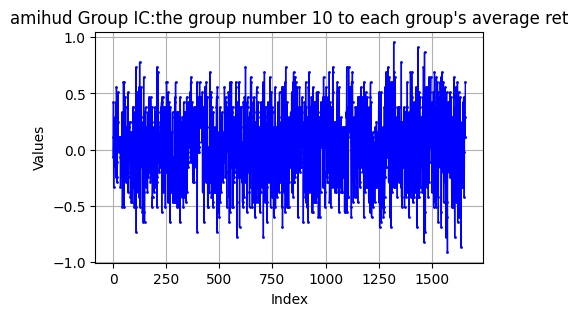

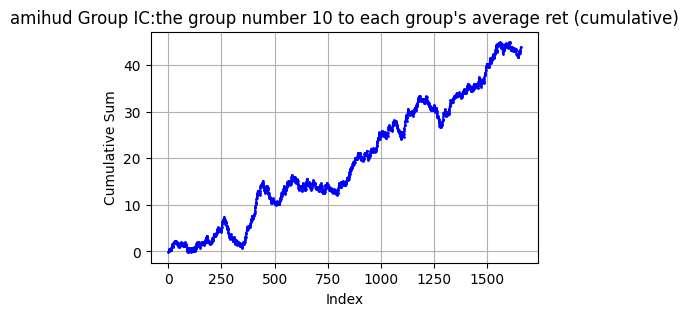

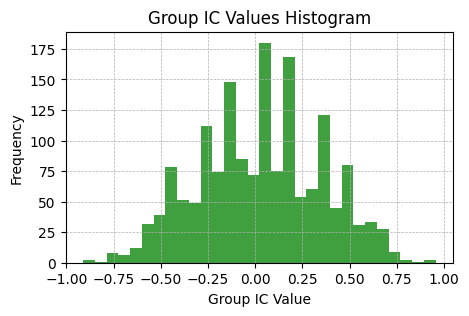

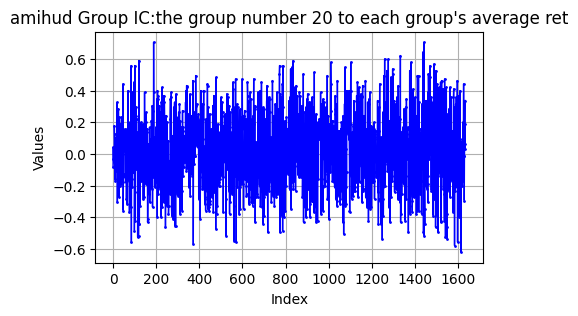

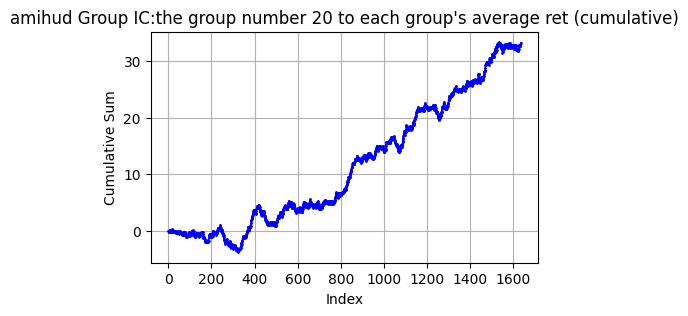

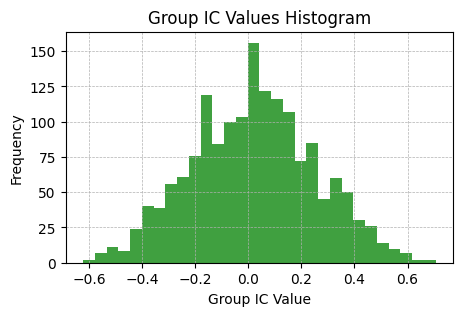

Mean R-squared: 0.0196
Median R-squared: 0.0060
Standard Deviation of R-squared: 0.0434


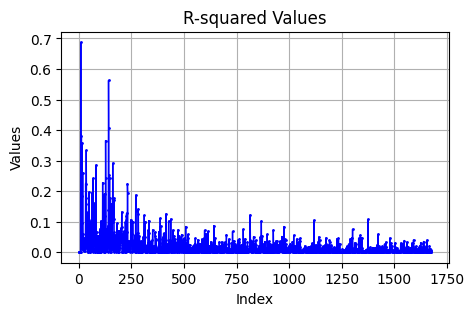

 ================================================ return_auto_corr_1_pearson_lag1 ======================================================== 
factors shape: (1678, 305)
    statistic  return_auto_corr_1_pearson_lag1
0       count                    230723.000000
1  null_count                         0.000000
2        mean                        -0.069438
3         std                         0.101364
4         min                        -1.000000
5         25%                        -0.111125
6         50%                        -0.064785
7         75%                        -0.022351
8         max                         1.000000
[[-0.0694382   0.10136352]]
Values beyond 3 standard deviations: 3445
Percentage of total: 1.49%


<Figure size 1000x600 with 0 Axes>

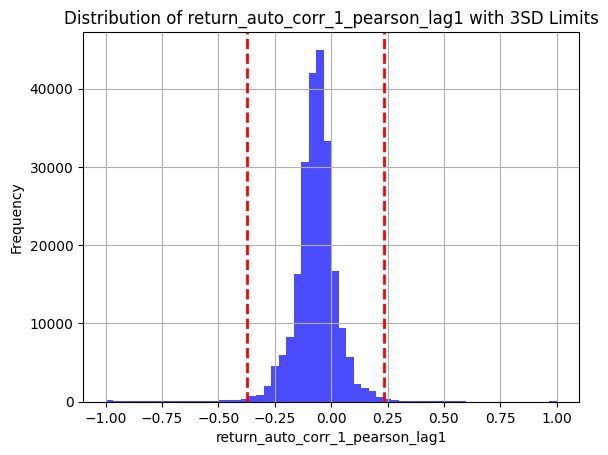

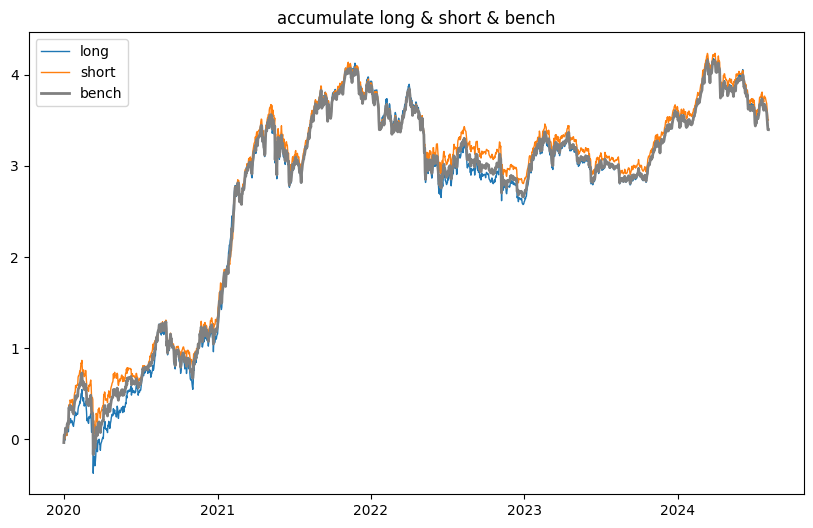

long: 
ann_return = 0.7382  sharpe = 0.7651  maxdd = 0.5932  calmar_ratio = 1.2445  

short: 
ann_return = 0.7615  sharpe = 0.8388  maxdd = 0.4621  calmar_ratio = 1.6478  

bench: 
ann_return = 0.7386  sharpe = 0.7942  maxdd = 0.5174  calmar_ratio = 1.4274  



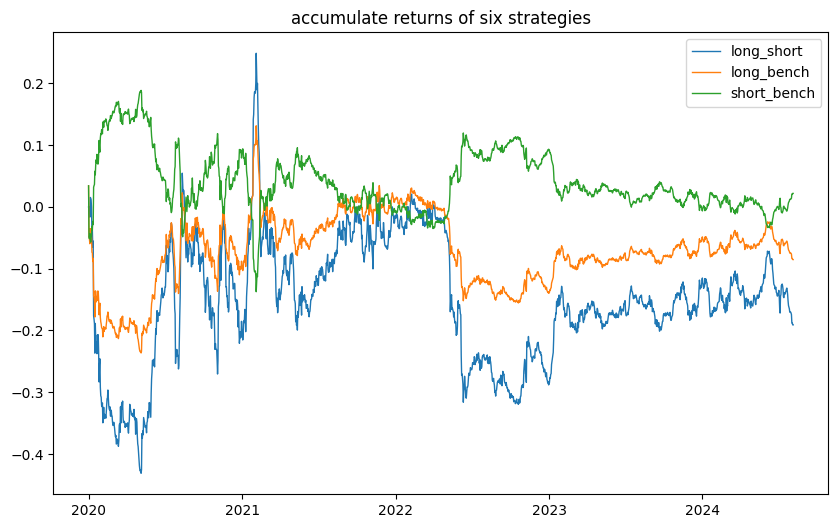

long_short: 
ann_return = -0.0415  sharpe = -0.1599  maxdd = 0.455  calmar_ratio = -0.0913  

long_bench: 
ann_return = -0.0186  sharpe = -0.1329  maxdd = 0.2615  calmar_ratio = -0.071  

bench_short: 
ann_return = -0.0412  sharpe = -0.3009  maxdd = 0.2849  calmar_ratio = -0.1447  

bench_long: 
ann_return = -0.0179  sharpe = -0.1283  maxdd = 0.3227  calmar_ratio = -0.0556  

short_long: 
ann_return = 0.005  sharpe = 0.0194  maxdd = 0.4984  calmar_ratio = 0.0101  

short_bench: 
ann_return = 0.0047  sharpe = 0.0345  maxdd = 0.2741  calmar_ratio = 0.0173  



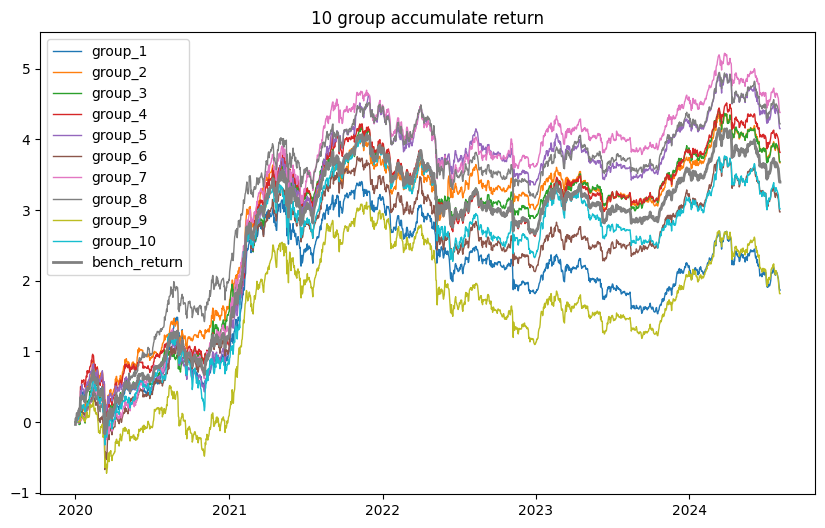

group_1: 
ann_return = 0.4059  sharpe = 0.4238  maxdd = 0.5262  calmar_ratio = 0.7715  

group_2: 
ann_return = 0.798  sharpe = 0.8574  maxdd = 0.3978  calmar_ratio = 2.0059  

group_3: 
ann_return = 0.8008  sharpe = 0.8703  maxdd = 0.5052  calmar_ratio = 1.585  

group_4: 
ann_return = 0.83  sharpe = 0.8858  maxdd = 0.5175  calmar_ratio = 1.6037  

group_5: 
ann_return = 0.9032  sharpe = 0.946  maxdd = 0.3928  calmar_ratio = 2.2994  

group_6: 
ann_return = 0.6468  sharpe = 0.6677  maxdd = 0.7714  calmar_ratio = 0.8384  

group_7: 
ann_return = 0.9529  sharpe = 0.9729  maxdd = 0.5461  calmar_ratio = 1.745  

group_8: 
ann_return = 0.9178  sharpe = 0.9295  maxdd = 0.5205  calmar_ratio = 1.7632  

group_9: 
ann_return = 0.3951  sharpe = 0.3952  maxdd = 0.7886  calmar_ratio = 0.501  

group_10: 
ann_return = 0.656  sharpe = 0.6021  maxdd = 0.5865  calmar_ratio = 1.1185  



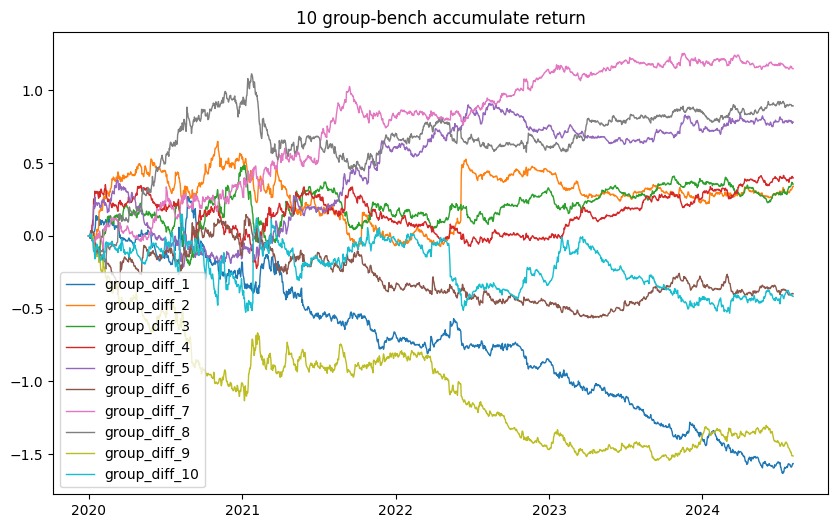

group_diff_1: 
ann_return = -0.3404  sharpe = -1.154  maxdd = 1.4969  calmar_ratio = -0.2274  

group_diff_2: 
ann_return = 0.0741  sharpe = 0.2375  maxdd = 0.4507  calmar_ratio = 0.1643  

group_diff_3: 
ann_return = 0.0773  sharpe = 0.2744  maxdd = 0.369  calmar_ratio = 0.2095  

group_diff_4: 
ann_return = 0.0866  sharpe = 0.3294  maxdd = 0.4257  calmar_ratio = 0.2033  

group_diff_5: 
ann_return = 0.17  sharpe = 0.6223  maxdd = 0.4328  calmar_ratio = 0.3927  

group_diff_6: 
ann_return = -0.0865  sharpe = -0.3164  maxdd = 0.6203  calmar_ratio = -0.1395  

group_diff_7: 
ann_return = 0.25  sharpe = 0.8766  maxdd = 0.1645  calmar_ratio = 1.52  

group_diff_8: 
ann_return = 0.1943  sharpe = 0.6536  maxdd = 0.3152  calmar_ratio = 0.6162  

group_diff_9: 
ann_return = -0.3289  sharpe = -1.0724  maxdd = 1.5436  calmar_ratio = -0.2131  

group_diff_10: 
ann_return = -0.0903  sharpe = -0.213  maxdd = 0.5931  calmar_ratio = -0.1523  

long_group_index_list: [1], short_group_index_list: [10]

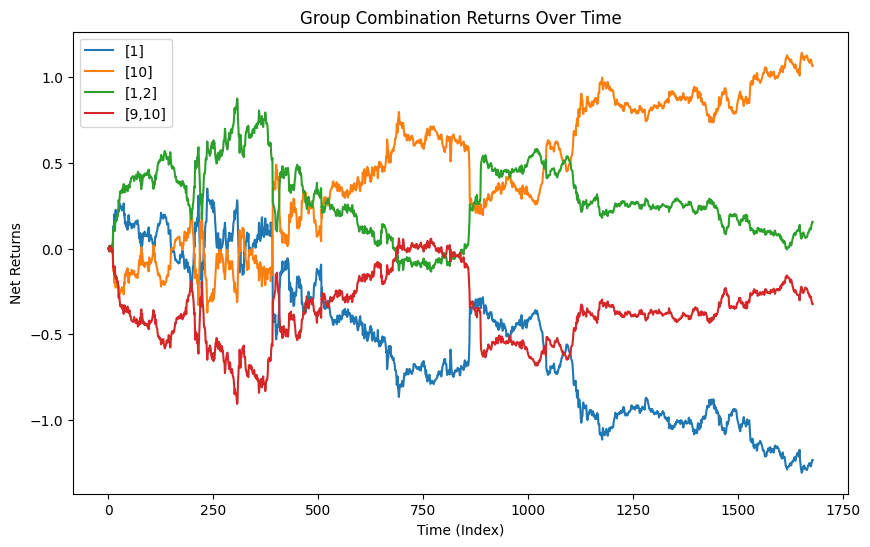

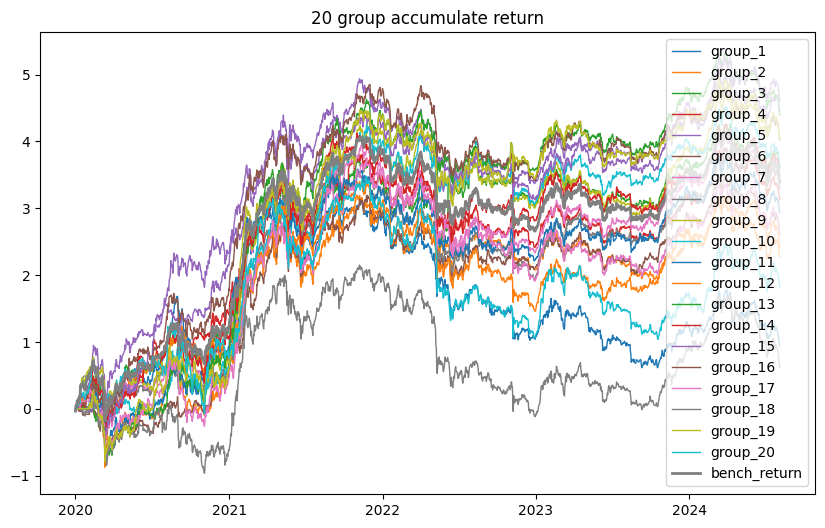

group_1: 
ann_return = 0.2041  sharpe = 0.201  maxdd = 0.6081  calmar_ratio = 0.3356  

group_2: 
ann_return = 0.4959  sharpe = 0.5171  maxdd = 0.7887  calmar_ratio = 0.6287  

group_3: 
ann_return = 0.7852  sharpe = 0.7863  maxdd = 0.4488  calmar_ratio = 1.7496  

group_4: 
ann_return = 0.6821  sharpe = 0.7206  maxdd = 0.5104  calmar_ratio = 1.3365  

group_5: 
ann_return = 0.9677  sharpe = 1.0008  maxdd = 0.4688  calmar_ratio = 2.0644  

group_6: 
ann_return = 0.5685  sharpe = 0.6141  maxdd = 0.7489  calmar_ratio = 0.7591  

group_7: 
ann_return = 0.7144  sharpe = 0.7538  maxdd = 0.707  calmar_ratio = 1.0105  

group_8: 
ann_return = 0.7195  sharpe = 0.7414  maxdd = 0.6217  calmar_ratio = 1.1573  

group_9: 
ann_return = 0.8783  sharpe = 0.8742  maxdd = 0.4762  calmar_ratio = 1.8445  

group_10: 
ann_return = 0.7896  sharpe = 0.8106  maxdd = 0.4533  calmar_ratio = 1.7419  

group_11: 
ann_return = 0.6389  sharpe = 0.6338  maxdd = 0.7795  calmar_ratio = 0.8196  

group_12: 
ann_return

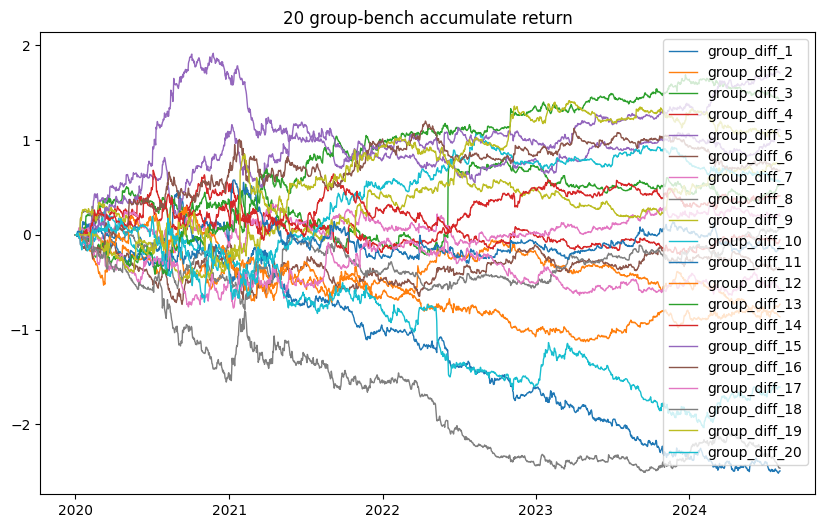

group_diff_1: 
ann_return = -0.5422  sharpe = -1.2775  maxdd = 2.0367  calmar_ratio = -0.2662  

group_diff_2: 
ann_return = -0.1594  sharpe = -0.4364  maxdd = 0.8937  calmar_ratio = -0.1783  

group_diff_3: 
ann_return = 0.1146  sharpe = 0.2423  maxdd = 0.499  calmar_ratio = 0.2297  

group_diff_4: 
ann_return = -0.0116  sharpe = -0.0313  maxdd = 0.5156  calmar_ratio = -0.0226  

group_diff_5: 
ann_return = 0.2412  sharpe = 0.639  maxdd = 0.3455  calmar_ratio = 0.6982  

group_diff_6: 
ann_return = -0.0791  sharpe = -0.2193  maxdd = 0.7339  calmar_ratio = -0.1078  

group_diff_7: 
ann_return = 0.0433  sharpe = 0.1218  maxdd = 0.3529  calmar_ratio = 0.1226  

group_diff_8: 
ann_return = 0.0134  sharpe = 0.0383  maxdd = 0.8386  calmar_ratio = 0.0159  

group_diff_9: 
ann_return = 0.1625  sharpe = 0.4018  maxdd = 0.6383  calmar_ratio = 0.2545  

group_diff_10: 
ann_return = 0.1231  sharpe = 0.3232  maxdd = 0.5834  calmar_ratio = 0.2109  

group_diff_11: 
ann_return = -0.0277  sharpe = -0

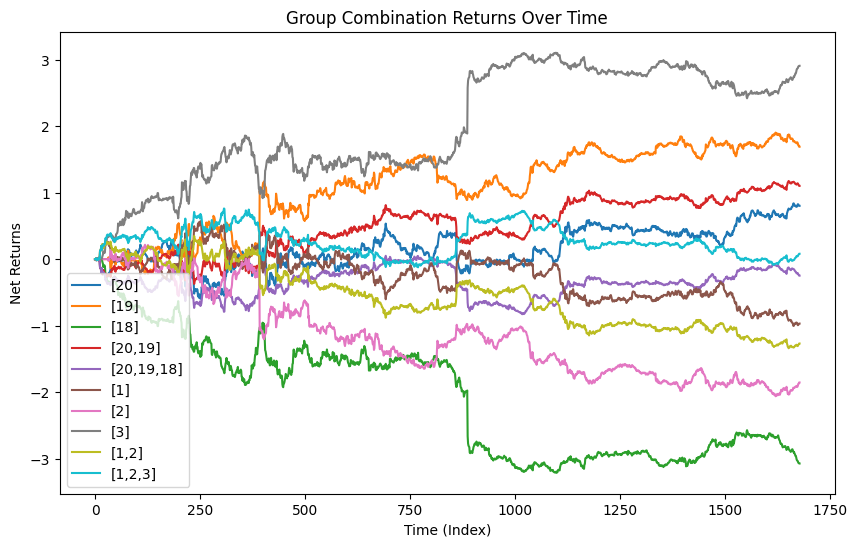

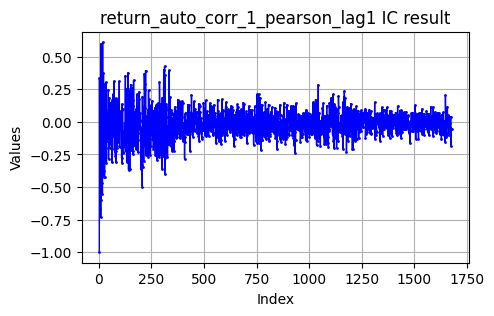

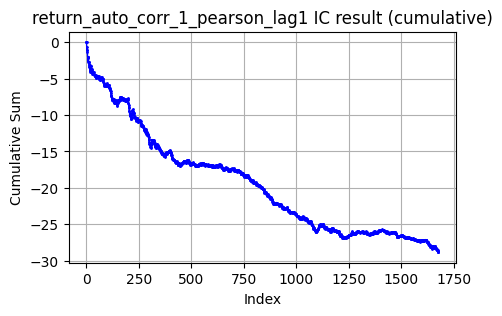

rank ic stat dict {'Mean IC': -0.01720347479622384, 'Median IC': -0.014657578464355654, 'Standard Deviation': 0.11523398899412052, 'Count of Significant ICs (|IC| > 0.1)': 453, 'Proportion of Significant ICs': 0.2701252236135957, 'Information Ratio (IR)': -0.14929167120216238, 'Skewness': -0.6114358245355832, 'Kurtosis': 7.091483774582803, 'T-Value': -6.111848589371363, 'P-Value': 1.2222791542591422e-09}


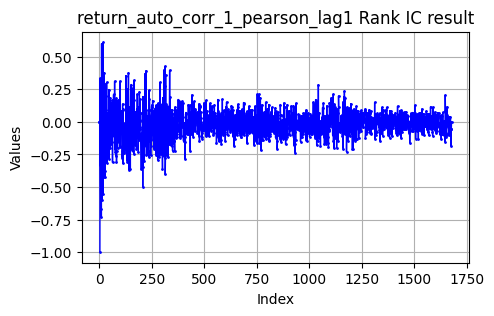

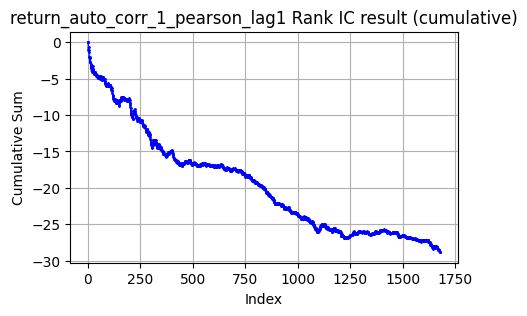

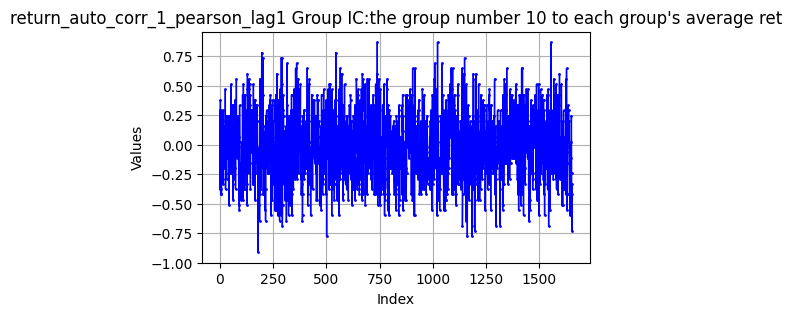

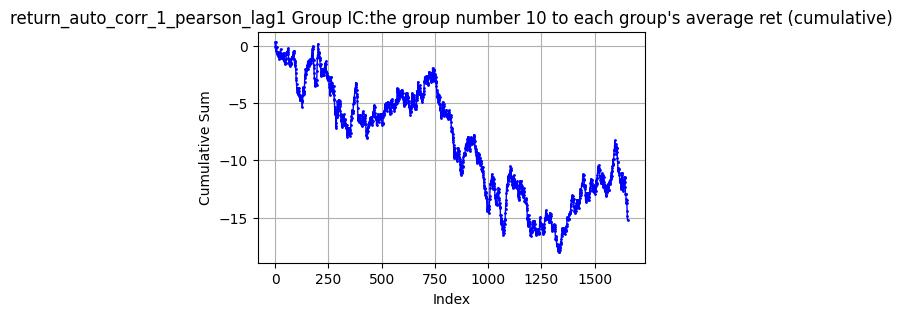

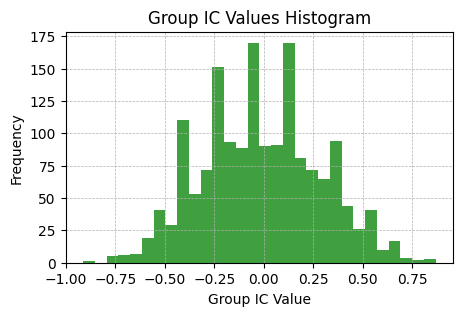

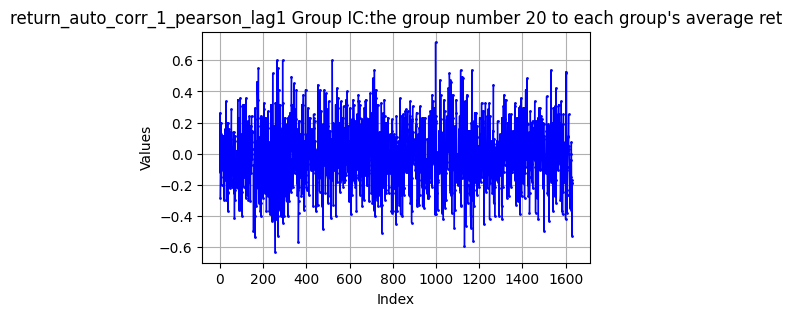

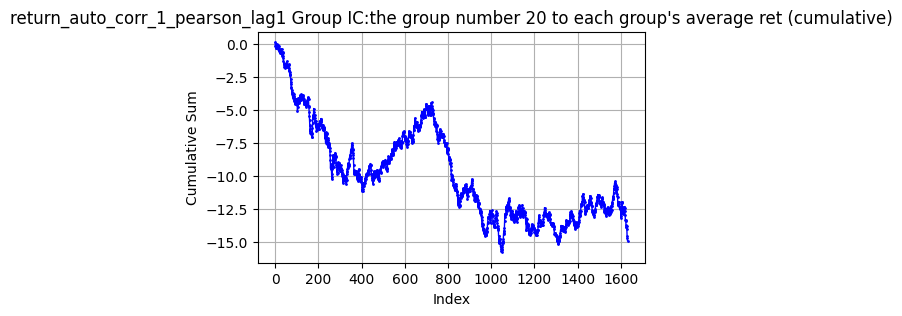

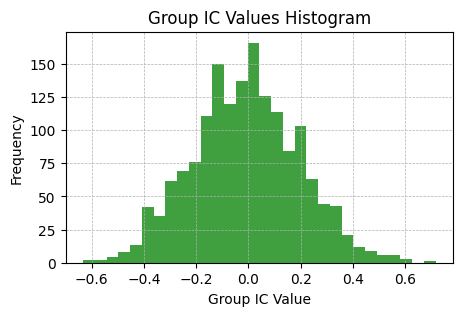

Mean R-squared: 0.0287
Median R-squared: 0.0079
Standard Deviation of R-squared: 0.0656


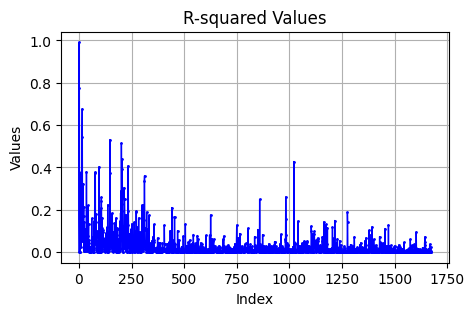

 ================================================ return_auto_corr_1_pearson_lag10 ======================================================== 
factors shape: (1678, 305)
    statistic  return_auto_corr_1_pearson_lag10
0       count                     230723.000000
1  null_count                          0.000000
2        mean                          0.002462
3         std                          0.095817
4         min                         -1.000000
5         25%                         -0.029737
6         50%                          0.005929
7         75%                          0.043792
8         max                          1.000000
[[0.00246242 0.09581717]]
Values beyond 3 standard deviations: 6989
Percentage of total: 3.03%


<Figure size 1000x600 with 0 Axes>

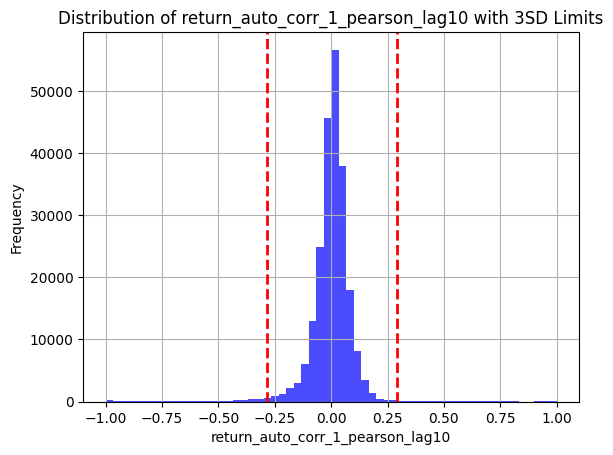

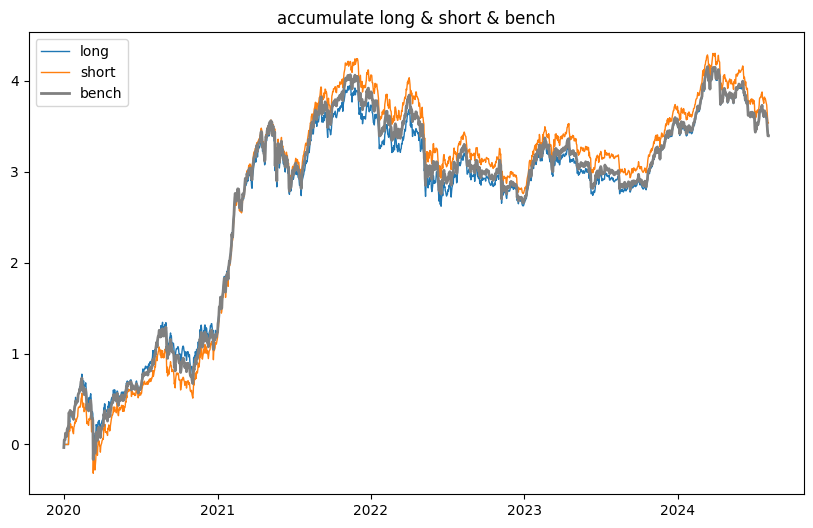

long: 
ann_return = 0.7376  sharpe = 0.7905  maxdd = 0.4899  calmar_ratio = 1.5057  

short: 
ann_return = 0.7692  sharpe = 0.8248  maxdd = 0.5633  calmar_ratio = 1.3657  

bench: 
ann_return = 0.7386  sharpe = 0.7942  maxdd = 0.5174  calmar_ratio = 1.4274  



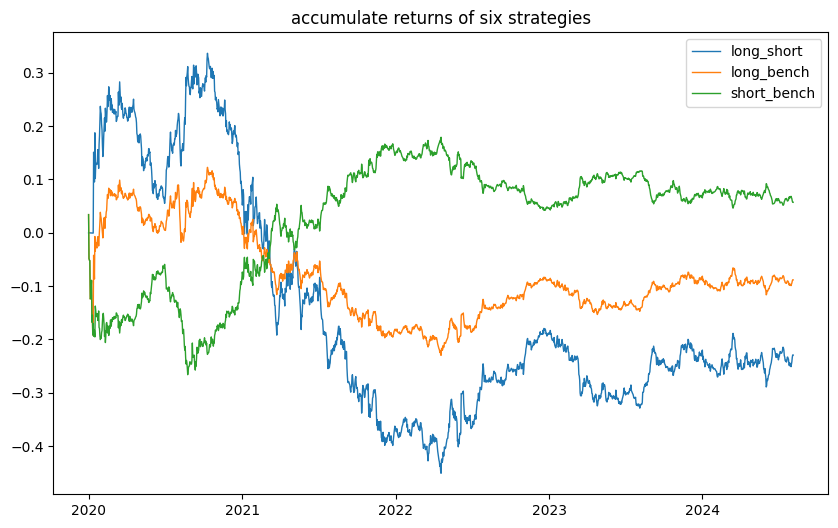

long_short: 
ann_return = -0.0498  sharpe = -0.2264  maxdd = 0.589  calmar_ratio = -0.0846  

long_bench: 
ann_return = -0.0192  sharpe = -0.1299  maxdd = 0.3139  calmar_ratio = -0.0611  

bench_short: 
ann_return = -0.0489  sharpe = -0.3743  maxdd = 0.4068  calmar_ratio = -0.1202  

bench_long: 
ann_return = -0.0173  sharpe = -0.1174  maxdd = 0.2868  calmar_ratio = -0.0604  

short_long: 
ann_return = 0.0133  sharpe = 0.0606  maxdd = 0.3648  calmar_ratio = 0.0366  

short_bench: 
ann_return = 0.0124  sharpe = 0.095  maxdd = 0.2902  calmar_ratio = 0.0428  



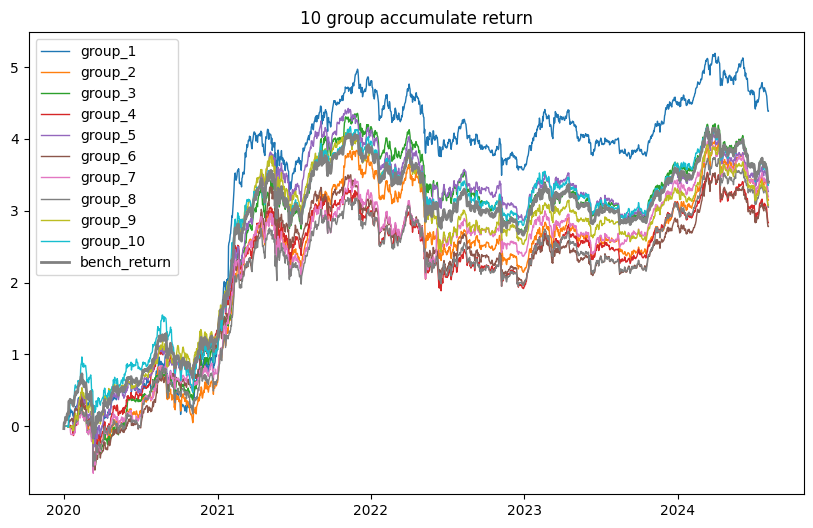

group_1: 
ann_return = 0.9539  sharpe = 0.9206  maxdd = 0.4877  calmar_ratio = 1.9558  

group_2: 
ann_return = 0.6845  sharpe = 0.7021  maxdd = 0.7066  calmar_ratio = 0.9688  

group_3: 
ann_return = 0.7434  sharpe = 0.7865  maxdd = 0.7208  calmar_ratio = 1.0313  

group_4: 
ann_return = 0.6164  sharpe = 0.6532  maxdd = 0.6892  calmar_ratio = 0.8943  

group_5: 
ann_return = 0.7107  sharpe = 0.7477  maxdd = 0.5923  calmar_ratio = 1.1998  

group_6: 
ann_return = 0.6047  sharpe = 0.6516  maxdd = 0.719  calmar_ratio = 0.8411  

group_7: 
ann_return = 0.6953  sharpe = 0.7127  maxdd = 0.7137  calmar_ratio = 0.9742  

group_8: 
ann_return = 0.663  sharpe = 0.7039  maxdd = 0.6541  calmar_ratio = 1.0136  

group_9: 
ann_return = 0.6691  sharpe = 0.7057  maxdd = 0.5047  calmar_ratio = 1.3257  

group_10: 
ann_return = 0.7299  sharpe = 0.7303  maxdd = 0.478  calmar_ratio = 1.5269  



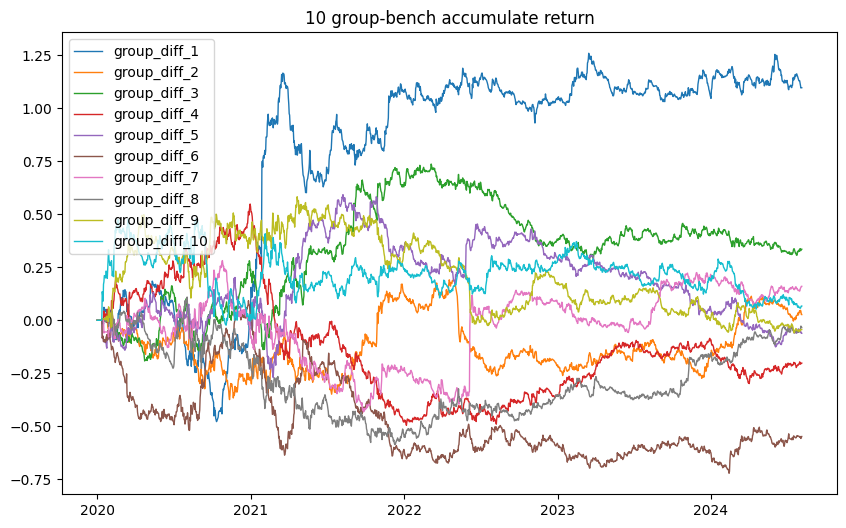

group_diff_1: 
ann_return = 0.2387  sharpe = 0.621  maxdd = 0.5594  calmar_ratio = 0.4266  

group_diff_2: 
ann_return = 0.0059  sharpe = 0.0213  maxdd = 0.3901  calmar_ratio = 0.0151  

group_diff_3: 
ann_return = 0.0729  sharpe = 0.2683  maxdd = 0.3275  calmar_ratio = 0.2227  

group_diff_4: 
ann_return = -0.0439  sharpe = -0.1707  maxdd = 0.6741  calmar_ratio = -0.0652  

group_diff_5: 
ann_return = -0.0134  sharpe = -0.0466  maxdd = 0.4511  calmar_ratio = -0.0296  

group_diff_6: 
ann_return = -0.1193  sharpe = -0.4427  maxdd = 0.7452  calmar_ratio = -0.16  

group_diff_7: 
ann_return = 0.0348  sharpe = 0.1105  maxdd = 0.5571  calmar_ratio = 0.0625  

group_diff_8: 
ann_return = -0.0074  sharpe = -0.0281  maxdd = 0.6274  calmar_ratio = -0.0118  

group_diff_9: 
ann_return = -0.0095  sharpe = -0.0337  maxdd = 0.4059  calmar_ratio = -0.0234  

group_diff_10: 
ann_return = 0.0146  sharpe = 0.0476  maxdd = 0.3394  calmar_ratio = 0.0431  

long_group_index_list: [1], short_group_index_l

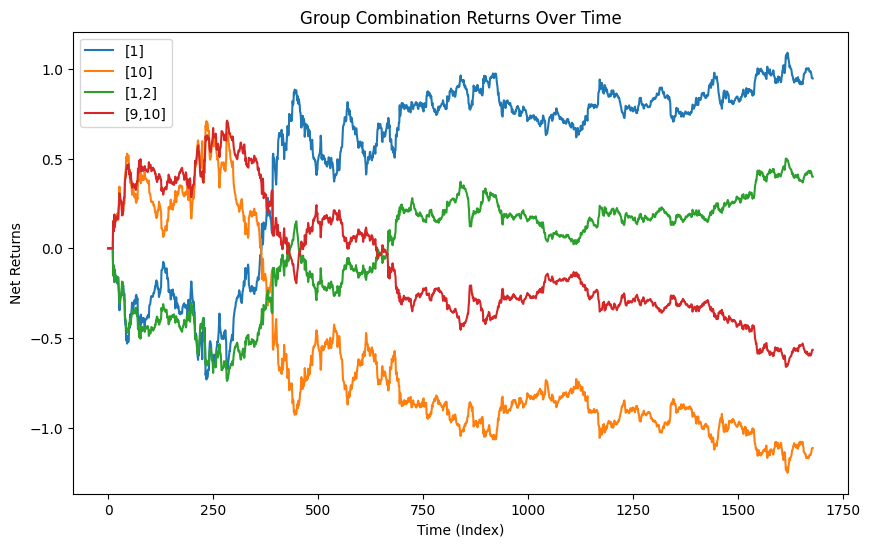

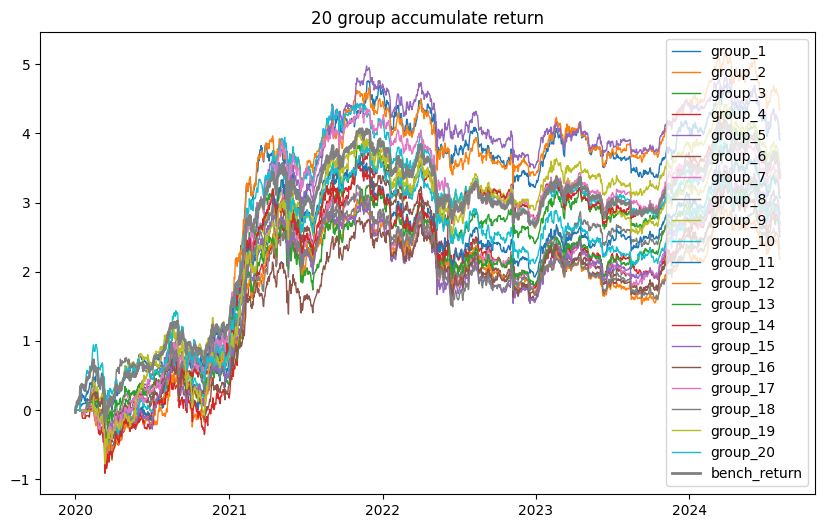

group_1: 
ann_return = 0.8502  sharpe = 0.7244  maxdd = 0.483  calmar_ratio = 1.7602  

group_2: 
ann_return = 0.9442  sharpe = 0.9157  maxdd = 0.788  calmar_ratio = 1.1982  

group_3: 
ann_return = 0.75  sharpe = 0.7314  maxdd = 0.5933  calmar_ratio = 1.2641  

group_4: 
ann_return = 0.5899  sharpe = 0.5864  maxdd = 0.9214  calmar_ratio = 0.6402  

group_5: 
ann_return = 0.8674  sharpe = 0.8754  maxdd = 0.696  calmar_ratio = 1.2463  

group_6: 
ann_return = 0.5455  sharpe = 0.5594  maxdd = 0.7332  calmar_ratio = 0.7439  

group_7: 
ann_return = 0.5702  sharpe = 0.5944  maxdd = 0.7545  calmar_ratio = 0.7557  

group_8: 
ann_return = 0.586  sharpe = 0.5961  maxdd = 0.8303  calmar_ratio = 0.7058  

group_9: 
ann_return = 0.6698  sharpe = 0.6859  maxdd = 0.5767  calmar_ratio = 1.1615  

group_10: 
ann_return = 0.6683  sharpe = 0.6709  maxdd = 0.7042  calmar_ratio = 0.949  

group_11: 
ann_return = 0.6664  sharpe = 0.6942  maxdd = 0.8138  calmar_ratio = 0.8189  

group_12: 
ann_return = 0.

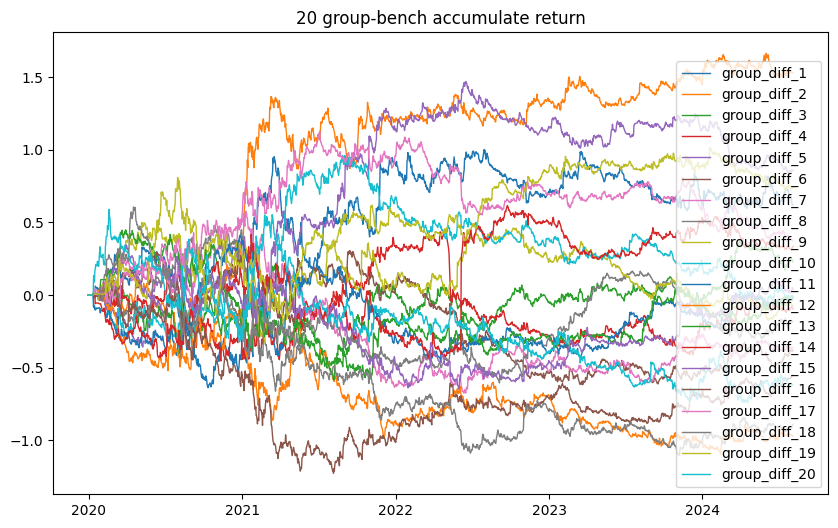

group_diff_1: 
ann_return = 0.135  sharpe = 0.2118  maxdd = 0.7265  calmar_ratio = 0.1858  

group_diff_2: 
ann_return = 0.3331  sharpe = 0.7593  maxdd = 0.457  calmar_ratio = 0.7288  

group_diff_3: 
ann_return = 0.0495  sharpe = 0.1217  maxdd = 0.5919  calmar_ratio = 0.0837  

group_diff_4: 
ann_return = -0.0208  sharpe = -0.0538  maxdd = 0.5944  calmar_ratio = -0.0351  

group_diff_5: 
ann_return = 0.1867  sharpe = 0.454  maxdd = 0.3824  calmar_ratio = 0.4882  

group_diff_6: 
ann_return = -0.0828  sharpe = -0.2261  maxdd = 0.7074  calmar_ratio = -0.1171  

group_diff_7: 
ann_return = -0.0785  sharpe = -0.2202  maxdd = 0.7939  calmar_ratio = -0.0988  

group_diff_8: 
ann_return = -0.0396  sharpe = -0.1105  maxdd = 0.7713  calmar_ratio = -0.0514  

group_diff_9: 
ann_return = -0.0158  sharpe = -0.0413  maxdd = 0.551  calmar_ratio = -0.0287  

group_diff_10: 
ann_return = -0.0025  sharpe = -0.0063  maxdd = 0.521  calmar_ratio = -0.0048  

group_diff_11: 
ann_return = -0.0044  sharpe =

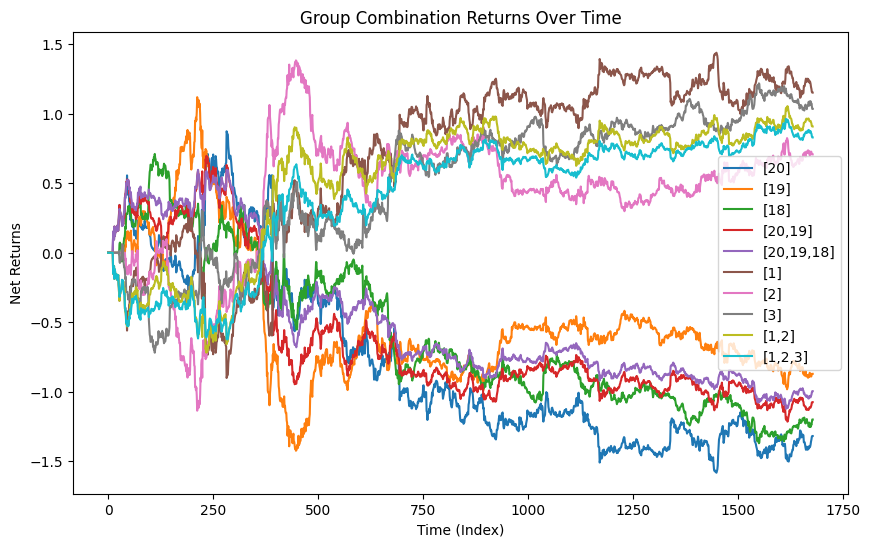

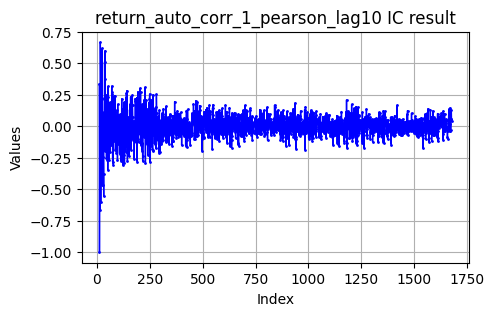

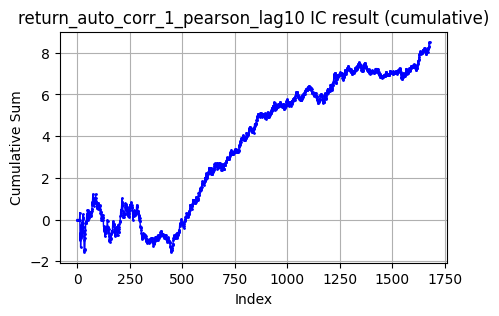

rank ic stat dict {'Mean IC': 0.005070418485311748, 'Median IC': 0.007728638900815799, 'Standard Deviation': 0.10058116527499938, 'Count of Significant ICs (|IC| > 0.1)': 340, 'Proportion of Significant ICs': 0.20274299344066785, 'Information Ratio (IR)': 0.050411212391989056, 'Skewness': -0.5719819686782646, 'Kurtosis': 12.275443624544865, 'T-Value': 2.0637835645182045, 'P-Value': 0.03919187380384498}


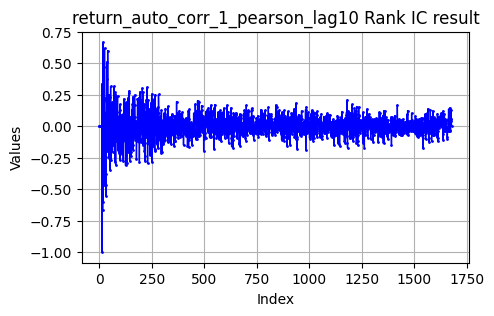

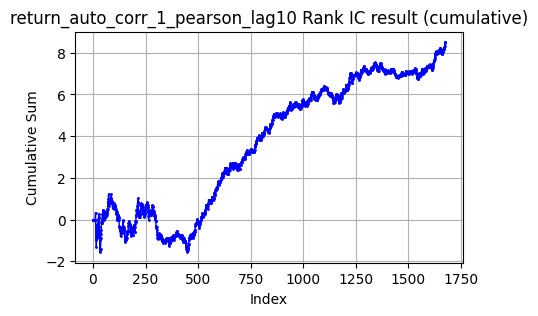

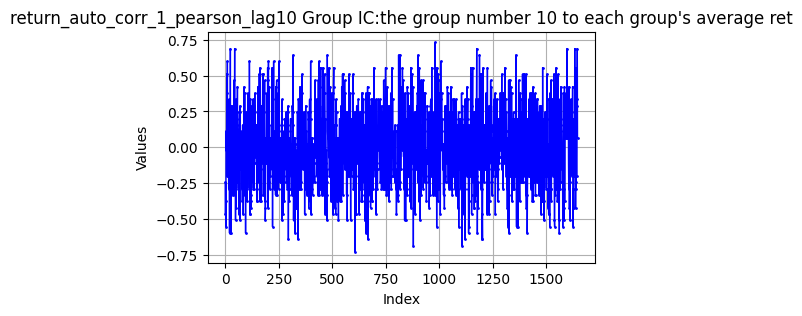

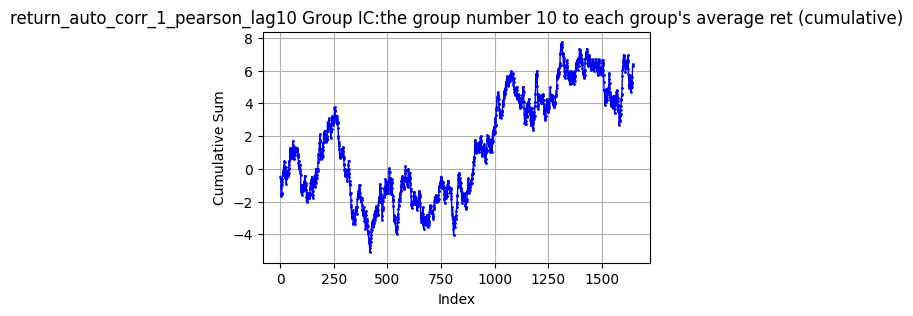

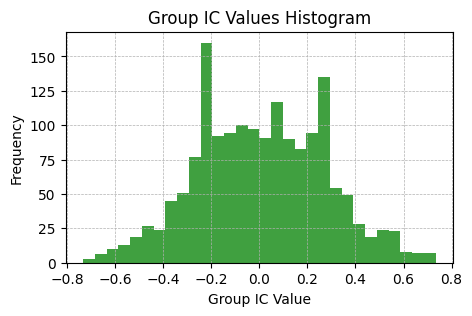

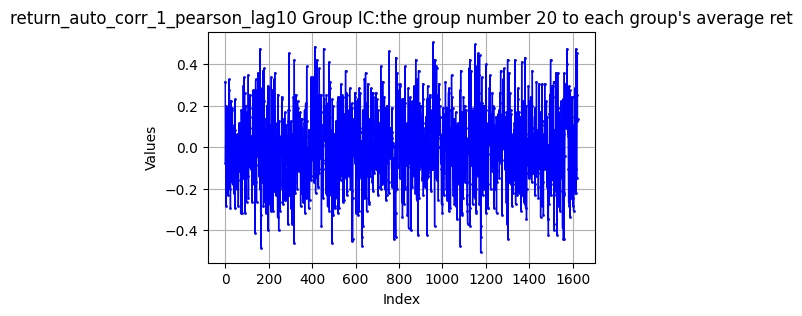

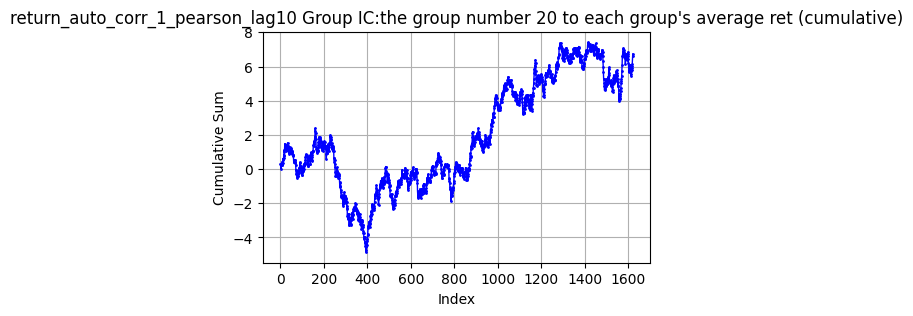

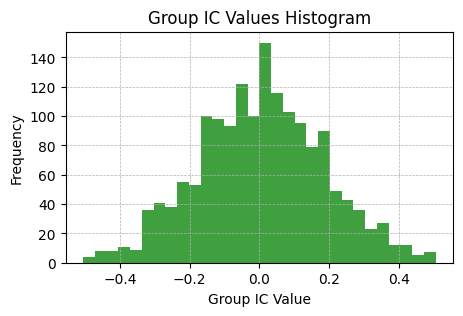

Mean R-squared: 0.0246
Median R-squared: 0.0064
Standard Deviation of R-squared: 0.0649


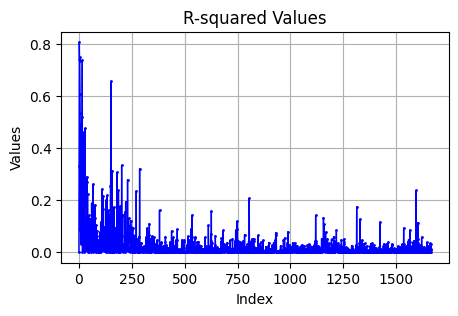

 ================================================ return_auto_corr_1_spearman_lag2 ======================================================== 
factors shape: (1678, 305)
    statistic  return_auto_corr_1_spearman_lag2
0       count                     230723.000000
1  null_count                          0.000000
2        mean                         -0.015112
3         std                          0.092248
4         min                         -1.000000
5         25%                         -0.041802
6         50%                         -0.010755
7         75%                          0.015639
8         max                          1.000000
[[-0.01511159  0.092248  ]]
Values beyond 3 standard deviations: 4624
Percentage of total: 2.00%


<Figure size 1000x600 with 0 Axes>

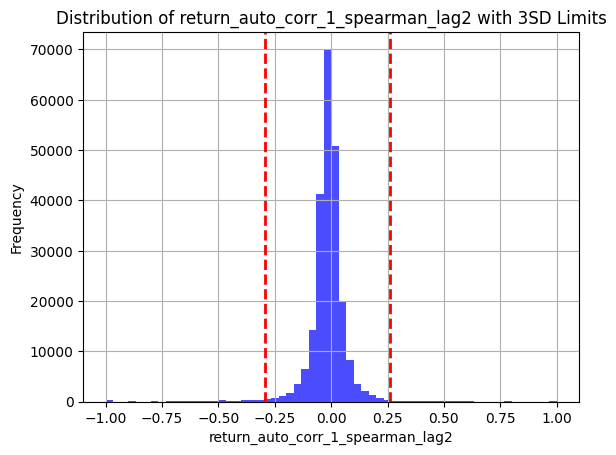

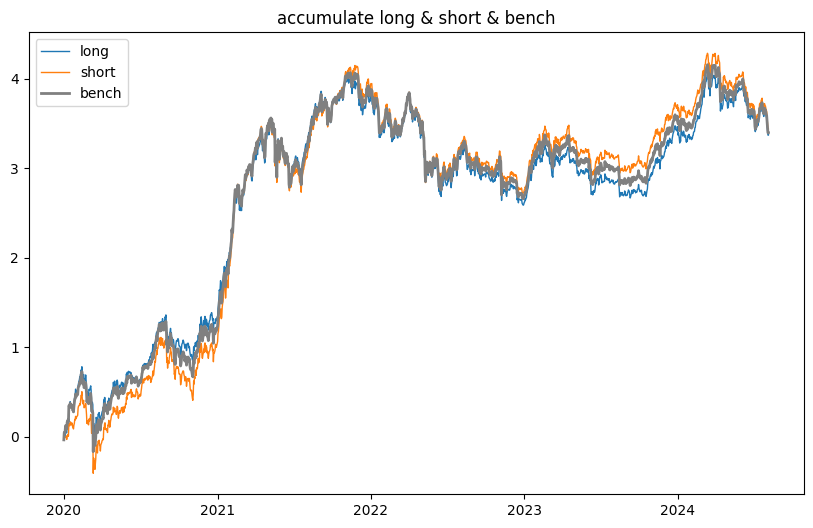

long: 
ann_return = 0.7331  sharpe = 0.7929  maxdd = 0.4811  calmar_ratio = 1.5237  

short: 
ann_return = 0.748  sharpe = 0.7947  maxdd = 0.6059  calmar_ratio = 1.2345  

bench: 
ann_return = 0.7386  sharpe = 0.7942  maxdd = 0.5174  calmar_ratio = 1.4274  



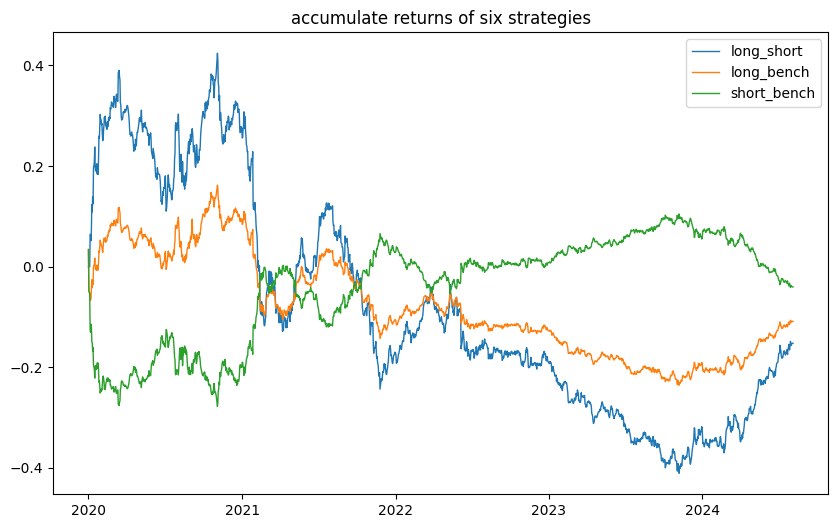

long_short: 
ann_return = -0.0331  sharpe = -0.1578  maxdd = 0.5863  calmar_ratio = -0.0565  

long_bench: 
ann_return = -0.0237  sharpe = -0.2089  maxdd = 0.3422  calmar_ratio = -0.0692  

bench_short: 
ann_return = -0.0277  sharpe = -0.2287  maxdd = 0.4053  calmar_ratio = -0.0684  

bench_long: 
ann_return = -0.0128  sharpe = -0.113  maxdd = 0.2427  calmar_ratio = -0.0528  

short_long: 
ann_return = -0.0034  sharpe = -0.016  maxdd = 0.455  calmar_ratio = -0.0074  

short_bench: 
ann_return = -0.0088  sharpe = -0.0727  maxdd = 0.3016  calmar_ratio = -0.0292  



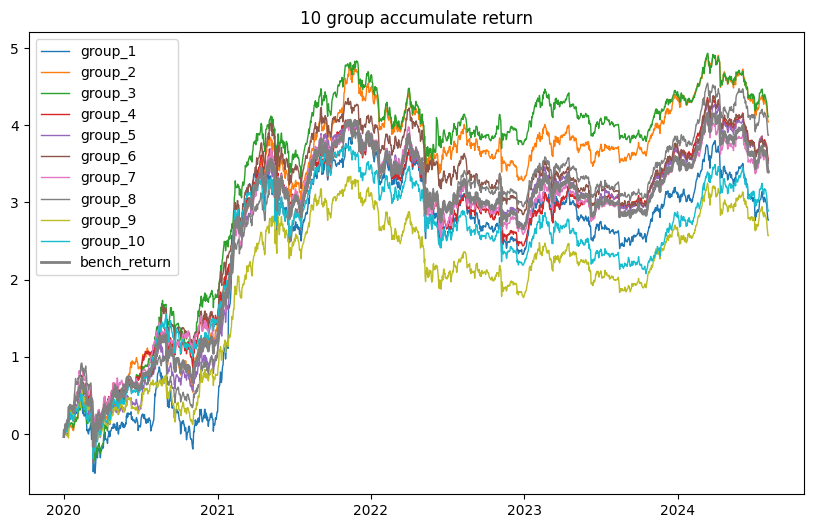

group_1: 
ann_return = 0.6032  sharpe = 0.5782  maxdd = 0.6625  calmar_ratio = 0.9104  

group_2: 
ann_return = 0.8797  sharpe = 0.8963  maxdd = 0.5726  calmar_ratio = 1.5363  

group_3: 
ann_return = 0.8942  sharpe = 0.91  maxdd = 0.5785  calmar_ratio = 1.5456  

group_4: 
ann_return = 0.7752  sharpe = 0.799  maxdd = 0.4973  calmar_ratio = 1.5588  

group_5: 
ann_return = 0.763  sharpe = 0.796  maxdd = 0.6199  calmar_ratio = 1.2309  

group_6: 
ann_return = 0.7698  sharpe = 0.7921  maxdd = 0.5132  calmar_ratio = 1.5001  

group_7: 
ann_return = 0.7362  sharpe = 0.7744  maxdd = 0.4574  calmar_ratio = 1.6095  

group_8: 
ann_return = 0.8421  sharpe = 0.888  maxdd = 0.5092  calmar_ratio = 1.6538  

group_9: 
ann_return = 0.5592  sharpe = 0.5867  maxdd = 0.5248  calmar_ratio = 1.0656  

group_10: 
ann_return = 0.6286  sharpe = 0.6461  maxdd = 0.5547  calmar_ratio = 1.1333  



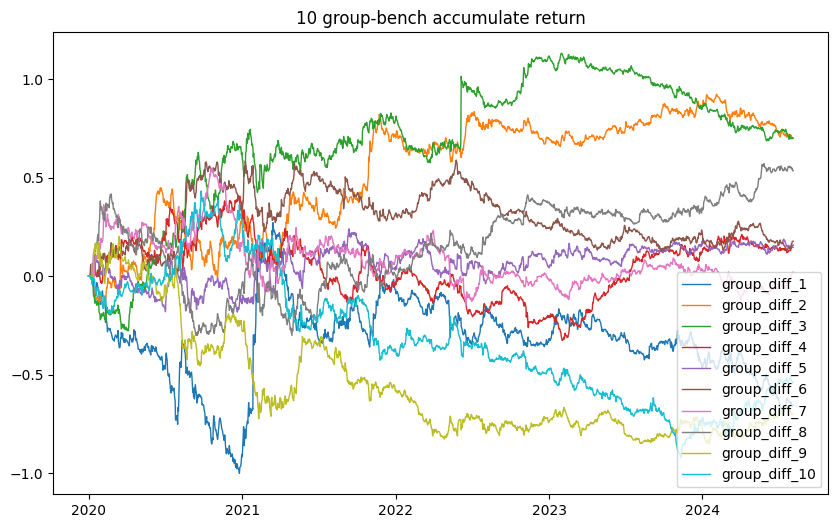

group_diff_1: 
ann_return = -0.1425  sharpe = -0.3584  maxdd = 1.0004  calmar_ratio = -0.1424  

group_diff_2: 
ann_return = 0.1521  sharpe = 0.4974  maxdd = 0.3158  calmar_ratio = 0.4817  

group_diff_3: 
ann_return = 0.1522  sharpe = 0.4653  maxdd = 0.2828  calmar_ratio = 0.5381  

group_diff_4: 
ann_return = 0.0341  sharpe = 0.1254  maxdd = 0.5209  calmar_ratio = 0.0654  

group_diff_5: 
ann_return = 0.0316  sharpe = 0.1222  maxdd = 0.2721  calmar_ratio = 0.1161  

group_diff_6: 
ann_return = 0.0384  sharpe = 0.1417  maxdd = 0.2922  calmar_ratio = 0.1314  

group_diff_7: 
ann_return = 0.0042  sharpe = 0.0152  maxdd = 0.4523  calmar_ratio = 0.0093  

group_diff_8: 
ann_return = 0.1162  sharpe = 0.4187  maxdd = 0.5068  calmar_ratio = 0.2293  

group_diff_9: 
ann_return = -0.1522  sharpe = -0.5504  maxdd = 0.8788  calmar_ratio = -0.1732  

group_diff_10: 
ann_return = -0.117  sharpe = -0.3987  maxdd = 0.9443  calmar_ratio = -0.1239  

long_group_index_list: [1], short_group_index_list:

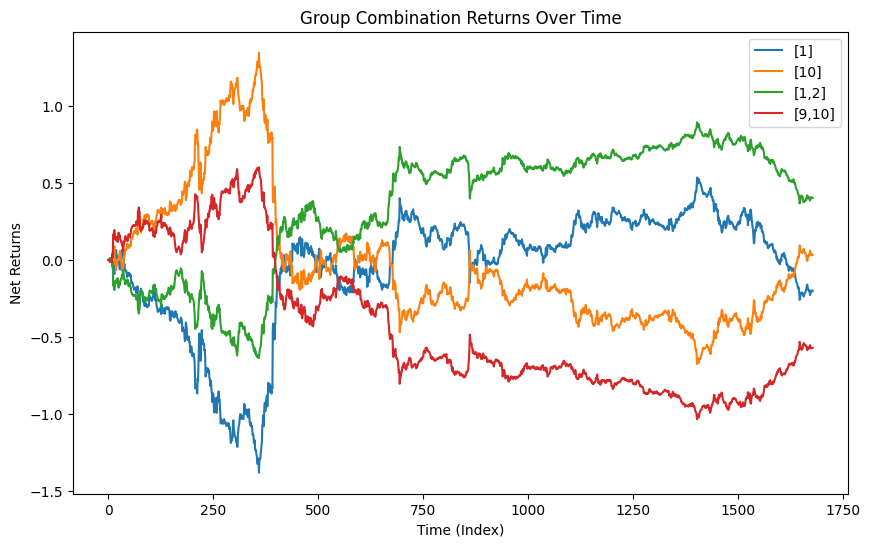

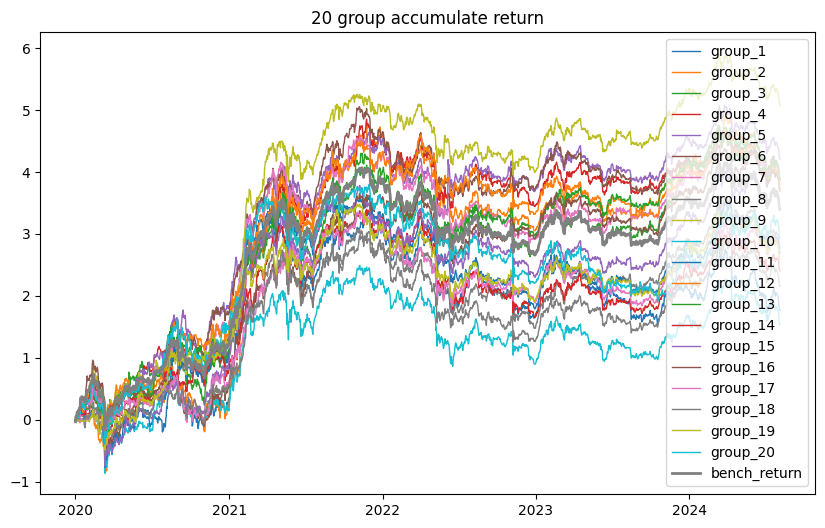

group_1: 
ann_return = 0.3843  sharpe = 0.3542  maxdd = 0.6157  calmar_ratio = 0.6242  

group_2: 
ann_return = 0.8381  sharpe = 0.7195  maxdd = 0.8581  calmar_ratio = 0.9766  

group_3: 
ann_return = 0.8458  sharpe = 0.8078  maxdd = 0.5432  calmar_ratio = 1.5572  

group_4: 
ann_return = 0.8117  sharpe = 0.795  maxdd = 0.672  calmar_ratio = 1.2079  

group_5: 
ann_return = 0.9154  sharpe = 0.8459  maxdd = 0.5981  calmar_ratio = 1.5305  

group_6: 
ann_return = 0.8456  sharpe = 0.8479  maxdd = 0.6425  calmar_ratio = 1.316  

group_7: 
ann_return = 0.8419  sharpe = 0.8343  maxdd = 0.5398  calmar_ratio = 1.5599  

group_8: 
ann_return = 0.6032  sharpe = 0.6087  maxdd = 0.5375  calmar_ratio = 1.1222  

group_9: 
ann_return = 1.105  sharpe = 1.1004  maxdd = 0.5501  calmar_ratio = 2.0087  

group_10: 
ann_return = 0.3345  sharpe = 0.3435  maxdd = 0.8844  calmar_ratio = 0.3782  

group_11: 
ann_return = 0.5868  sharpe = 0.5872  maxdd = 0.8078  calmar_ratio = 0.7265  

group_12: 
ann_return =

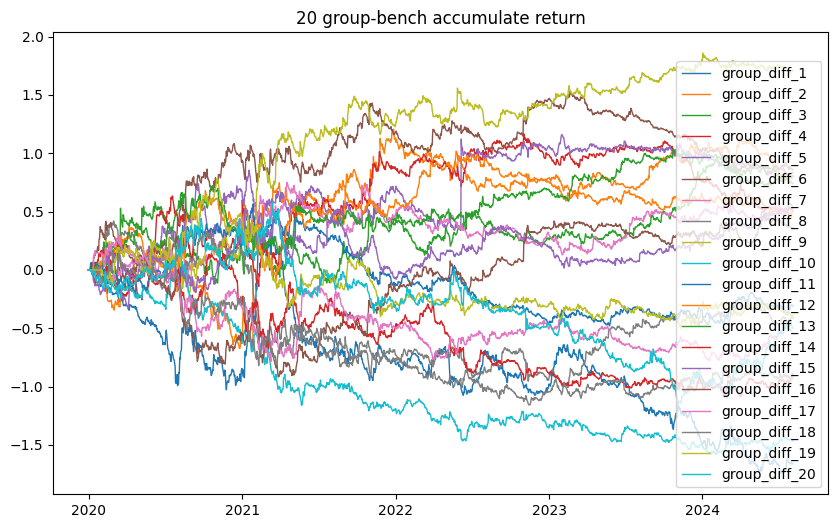

group_diff_1: 
ann_return = -0.3613  sharpe = -0.7264  maxdd = 1.5765  calmar_ratio = -0.2292  

group_diff_2: 
ann_return = 0.1729  sharpe = 0.2659  maxdd = 0.7549  calmar_ratio = 0.229  

group_diff_3: 
ann_return = 0.1611  sharpe = 0.3429  maxdd = 0.443  calmar_ratio = 0.3636  

group_diff_4: 
ann_return = 0.1112  sharpe = 0.2617  maxdd = 0.4747  calmar_ratio = 0.2343  

group_diff_5: 
ann_return = 0.1756  sharpe = 0.3272  maxdd = 0.3327  calmar_ratio = 0.5277  

group_diff_6: 
ann_return = 0.1873  sharpe = 0.4682  maxdd = 0.2817  calmar_ratio = 0.6647  

group_diff_7: 
ann_return = 0.1115  sharpe = 0.2891  maxdd = 0.3547  calmar_ratio = 0.3143  

group_diff_8: 
ann_return = -0.0888  sharpe = -0.2395  maxdd = 1.0064  calmar_ratio = -0.0882  

group_diff_9: 
ann_return = 0.3715  sharpe = 0.9259  maxdd = 0.3659  calmar_ratio = 1.0152  

group_diff_10: 
ann_return = -0.3199  sharpe = -0.976  maxdd = 1.5424  calmar_ratio = -0.2074  

group_diff_11: 
ann_return = -0.0675  sharpe = -0.181

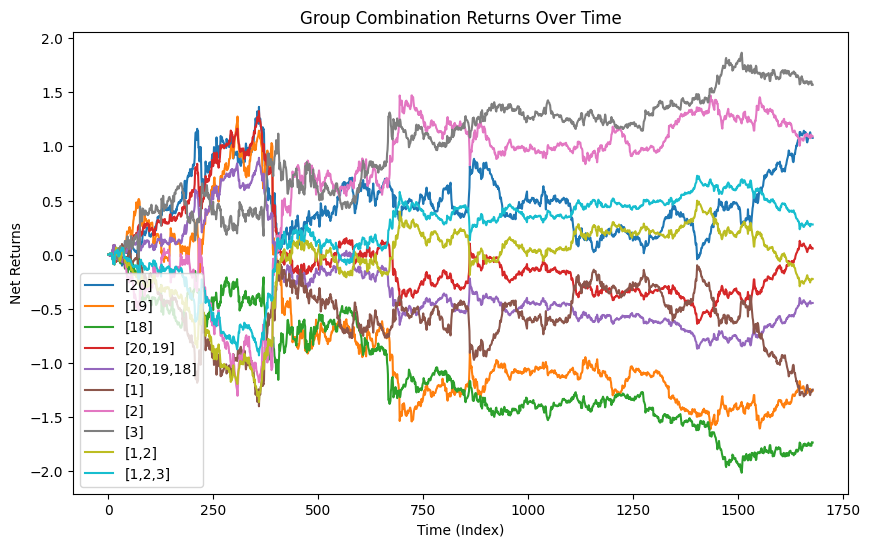

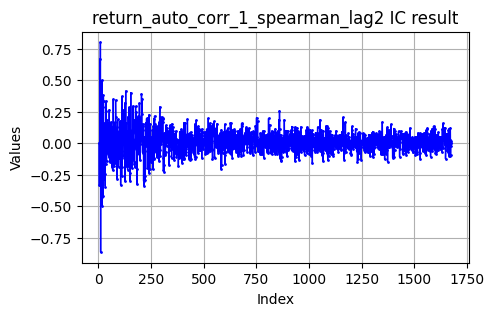

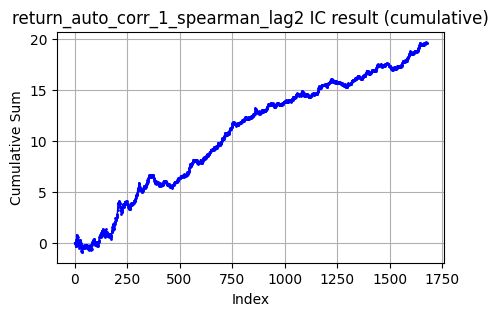

rank ic stat dict {'Mean IC': 0.011671178972739706, 'Median IC': 0.012796141296637822, 'Standard Deviation': 0.09850178338754453, 'Count of Significant ICs (|IC| > 0.1)': 336, 'Proportion of Significant ICs': 0.2003577817531306, 'Information Ratio (IR)': 0.11848698136581673, 'Skewness': 0.049662274054131025, 'Kurtosis': 9.6574141474304, 'T-Value': 4.850736039647527, 'P-Value': 1.3441033236337527e-06}


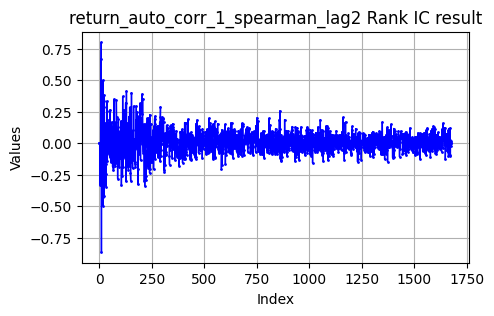

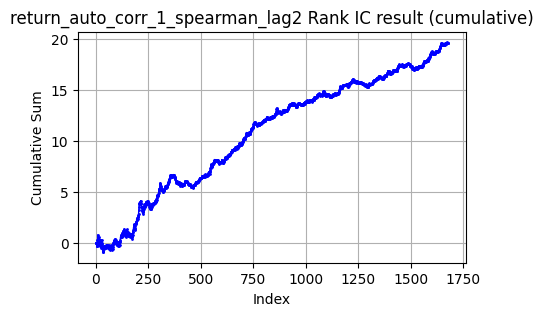

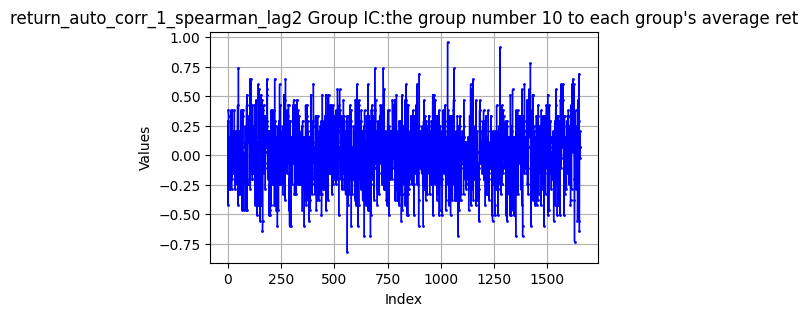

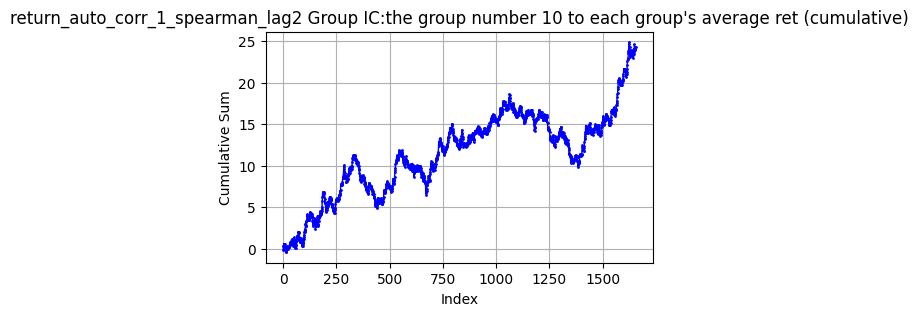

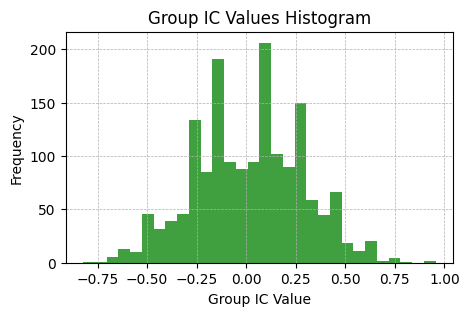

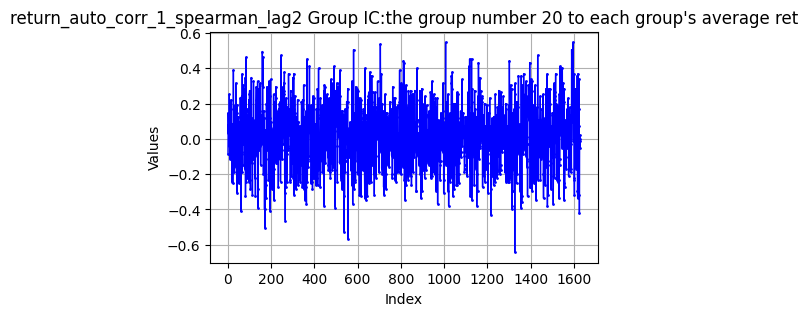

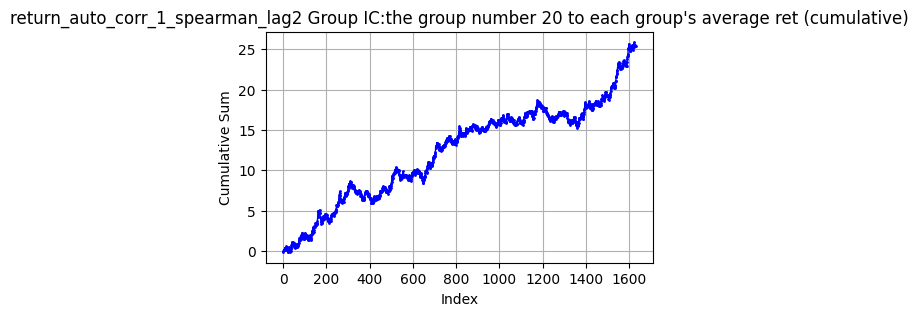

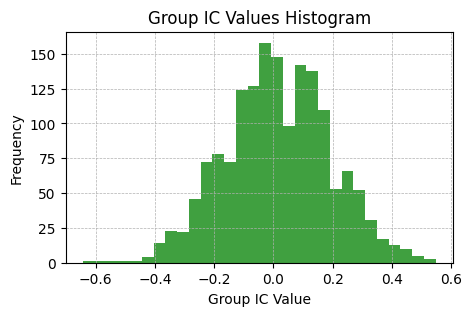

Mean R-squared: 0.0242
Median R-squared: 0.0072
Standard Deviation of R-squared: 0.0570


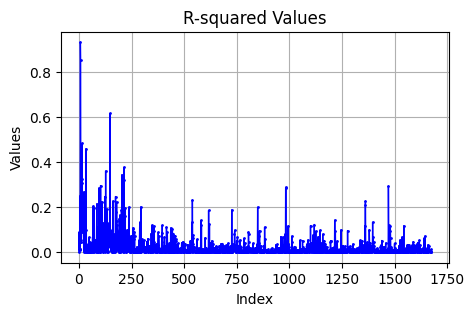

In [225]:
FACTOR_LIST = ["amihud", "alpha24", "alpha25"]
FACTOR_LIST = ["amihud"]
FACTOR_LIST = []
# for i in result_hour.columns:
#     if i.startswith('alpha'):
#         FACTOR_LIST.append(i)
for i in range (96, 102):
    if f'alpha{i}' in result_hour.columns and i not in [75, 84, 95]:
        FACTOR_LIST.append(f'alpha{i}')
        
FACTOR_LIST = [ 'return_skew',  'amihud', 'return_auto_corr_1_pearson_lag1', 'return_auto_corr_1_pearson_lag10', 'return_auto_corr_1_spearman_lag2']

print (f'factor list: {FACTOR_LIST}')
for each_factor in FACTOR_LIST:
    print (f' ================================================ {each_factor} ======================================================== ')
    SingleFactorEvalAndPlot (result_hour, each_factor, group_num = [10, 20])